In [13]:
import os
import numpy as np
import glob
from tqdm import tqdm
import copy
from skimage.feature import canny
from skimage.transform import resize
import pandas as pd
import seaborn as sns
import nibabel as nib

# from torchinfo import summary

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torchio as tio
import networks_gan
import losses
from skimage.metrics import structural_similarity as ssim
from dataloader import RadOncTrainingDataset, RadOncValidationDataset, RadOncSynthesisDataset, headscanner_training_dataset, headscanner_validation_dataset
import surface_distance
from helpers import compute_surface_metrics, compute_TRE
os.environ['VXM_BACKEND'] = 'pytorch'
import voxelmorph as vxm  # nopep8

import matplotlib.pyplot as plt
from matplotlib import colors as mplcolors
from matplotlib.collections import LineCollection
def colormap_binary(fg, bg=(0,0,0), alpha=None):
    fg = mplcolors.to_rgb(fg)
    bg = mplcolors.to_rgb(bg)
    cmap = mplcolors.LinearSegmentedColormap.from_list('Binary', (bg,fg), 256)
    if alpha is not None:
        cmap._init()
        cmap._lut[:,-1] = np.linspace(0, alpha, cmap.N+3)
    return cmap
from mpl_toolkits.axes_grid1 import make_axes_locatable
plt.style.use('dark_background')

In [15]:
valid_dataset = RadOncValidationDataset("/mnt/blackhole-data2/RadOnc_Brain/Validation", num_samples=None, supervision=True,
                                            return_segmentation=True)
device = torch.device('cpu')

In [14]:
valid_dataset = RadOncValidationDataset("/home/myi16/jsr_Y/md4_val", num_samples=None, supervision=True,uncert = True,
                                            return_segmentation=True)
device = torch.device('cpu')

In [20]:
G = networks_gan.JSRCascade(separate_decoders=True, res=True, version='v5').to(device)
checkpoint = torch.load('JSREDLuns_lastlayer_init_nosl_mix_l1100_unc0.1_inunc1_multi0.3_reg100_seg6_ep59.pt', map_location=torch.device('cpu'))
G.load_state_dict(checkpoint['G_state_dict'])

<All keys matched successfully>

In [17]:
import torch.nn.functional as F
class MIND_metric:
    """
    Modality-Independent NeighborHood Descriptor
    """

    def __init__(self, vol_size, d, patch_size, use_ssc=False, use_gaussian_kernel=False,
                 use_fixed_var=True, device='cuda'):
        self.epsilon = 0.000001
        self.vol_size = vol_size
        self.d = d
        self.patch_size = patch_size
        self.use_ssc = use_ssc
        self.use_gaussian_kernel = use_gaussian_kernel
        self.use_fixed_var = use_fixed_var

        if use_gaussian_kernel:
            dist = torch.distributions.normal.Normal(torch.tensor([0.0]), torch.tensor([1.0]))

            vals = torch.exp(dist.log_prob(torch.arange(-(patch_size - 1) / 2, (patch_size - 1) / 2 + 1)))
            kernel = torch.einsum('i,j,k->ijk', vals, vals, vals)
            kernel = kernel / torch.sum(kernel)
            self.kernel = kernel.unsqueeze(0).unsqueeze(0)
        else:
            self.kernel = torch.ones([1, 1, patch_size, patch_size, patch_size]) / (patch_size ** 3)
        self.kernel = self.kernel.to(device)

    def ssd_shift(self, image, direction):
        # expects a 3d image
        x, y, z = self.vol_size
        new_shift = np.clip(direction, 0, None)
        old_shift = -np.clip(direction, None, 0)

        # translate images
        new_image = image[:, :, new_shift[0]:x - old_shift[0], new_shift[1]:y - old_shift[1],
                    new_shift[2]:z - old_shift[2]]
        old_image = image[:, :, old_shift[0]:x - new_shift[0], old_shift[1]:y - new_shift[1],
                    old_shift[2]:z - new_shift[2]]
        # get squared difference
        diff = torch.square(new_image - old_image)

        # pad the diff
        # padding = np.concatenate((np.array([[0,0]]), np.transpose([old_shift, new_shift])))
        padding = (old_shift[2], new_shift[2], old_shift[1], new_shift[1], old_shift[0], new_shift[0])
        diff = F.pad(diff, padding)

        # apply convolution
        conv = F.conv3d(diff, self.kernel, padding=(self.patch_size // 2))
        return conv

    def mind_loss(self, y_true, y_pred):
        ndims = 3
        y_true = y_true
        y_pred = y_pred
        loss_tensor = 0

        if self.use_fixed_var:
            y_true_var = 0.004
            y_pred_var = 0.004
        else:
            y_true_var = 0
            y_pred_var = 0
            for i in range(ndims):
                direction = [0] * ndims
                direction[i] = self.d

                y_true_var += self.ssd_shift(y_true, direction)
                y_pred_var += self.ssd_shift(y_pred, direction)

                direction = [0] * ndims
                direction[i] = -self.d
                y_true_var += self.ssd_shift(y_true, direction)
                y_pred_var += self.ssd_shift(y_pred, direction)

            y_true_var = y_true_var / (ndims * 2) + self.epsilon
            y_pred_var = y_pred_var / (ndims * 2) + self.epsilon

        # print(y_true_var)
        for i in range(ndims):
            direction = [0] * ndims
            direction[i] = self.d

            loss_tensor += torch.abs(torch.exp(-self.ssd_shift(y_true, direction) / y_true_var)
                                                - torch.exp(-self.ssd_shift(y_pred, direction) / y_pred_var))

            direction = [0] * ndims
            direction[i] = -self.d
            loss_tensor += torch.abs(torch.exp(-self.ssd_shift(y_true, direction) / y_true_var)
                                                - torch.exp(-self.ssd_shift(y_pred, direction) / y_pred_var))

        return loss_tensor / (ndims * 2)

    def loss(self, y_true, y_pred):
        return self.mind_loss(y_true, y_pred)

In [18]:
import math
class NCC_metric:
    """
    Local (over window) normalized cross correlation loss.
    """

    def __init__(self, win=None, eps=1e-5, device='cuda', thresh=None):
        self.win = win
        self.eps = torch.tensor([eps]).float().to(device)
        self.device = torch.device(device)
        self.thresh = thresh

    def loss(self, y_true, y_pred):
        if self.thresh:
            Ii = y_true * (y_true < self.thresh).float()
            Ji = y_pred * (y_true < self.thresh).float()
        else:
            Ii = y_true
            Ji = y_pred

        # get dimension of volume
        # assumes Ii, Ji are sized [batch_size, *vol_shape, nb_feats]
        ndims = len(list(Ii.size())) - 2
        assert ndims in [1, 2, 3], "volumes should be 1 to 3 dimensions. found: %d" % ndims

        # set window size
        win = [9] * ndims if self.win is None else self.win

        # compute filters
        sum_filt = torch.ones([1, 1, *win]).to(self.device)

        pad_no = math.floor(win[0] / 2)

        if ndims == 1:
            stride = (1)
            padding = (pad_no)
        elif ndims == 2:
            stride = (1, 1)
            padding = (pad_no, pad_no)
        else:
            stride = (1, 1, 1)
            padding = (pad_no, pad_no, pad_no)

        # get convolution function
        conv_fn = getattr(F, 'conv%dd' % ndims)

        # compute CC squares
        I2 = Ii * Ii
        J2 = Ji * Ji
        IJ = Ii * Ji

        I_sum = conv_fn(Ii, sum_filt, stride=stride, padding=padding)
        J_sum = conv_fn(Ji, sum_filt, stride=stride, padding=padding)
        I2_sum = conv_fn(I2, sum_filt, stride=stride, padding=padding)
        J2_sum = conv_fn(J2, sum_filt, stride=stride, padding=padding)
        IJ_sum = conv_fn(IJ, sum_filt, stride=stride, padding=padding)

        win_size = np.prod(win)
        u_I = I_sum / win_size
        u_J = J_sum / win_size

        cross = IJ_sum - u_J * I_sum - u_I * J_sum + u_I * u_J * win_size
        cross = torch.maximum(cross, self.eps)
        I_var = I2_sum - 2 * u_I * I_sum + u_I * u_I * win_size
        I_var = torch.maximum(I_var, self.eps)
        J_var = J2_sum - 2 * u_J * J_sum + u_J * u_J * win_size
        J_var = torch.maximum(J_var, self.eps)

        cc = (cross / I_var) * (cross / J_var)

        return -cc

  0%|          | 0/10 [00:00<?, ?it/s]

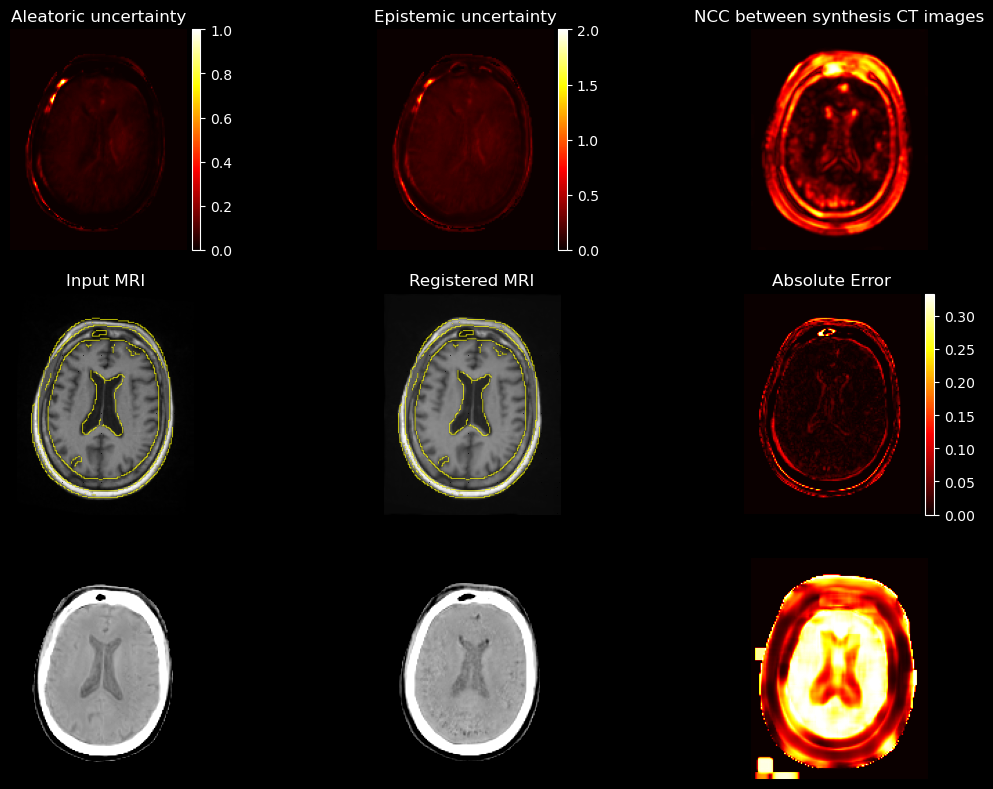

 10%|█         | 1/10 [00:11<01:46, 11.88s/it]

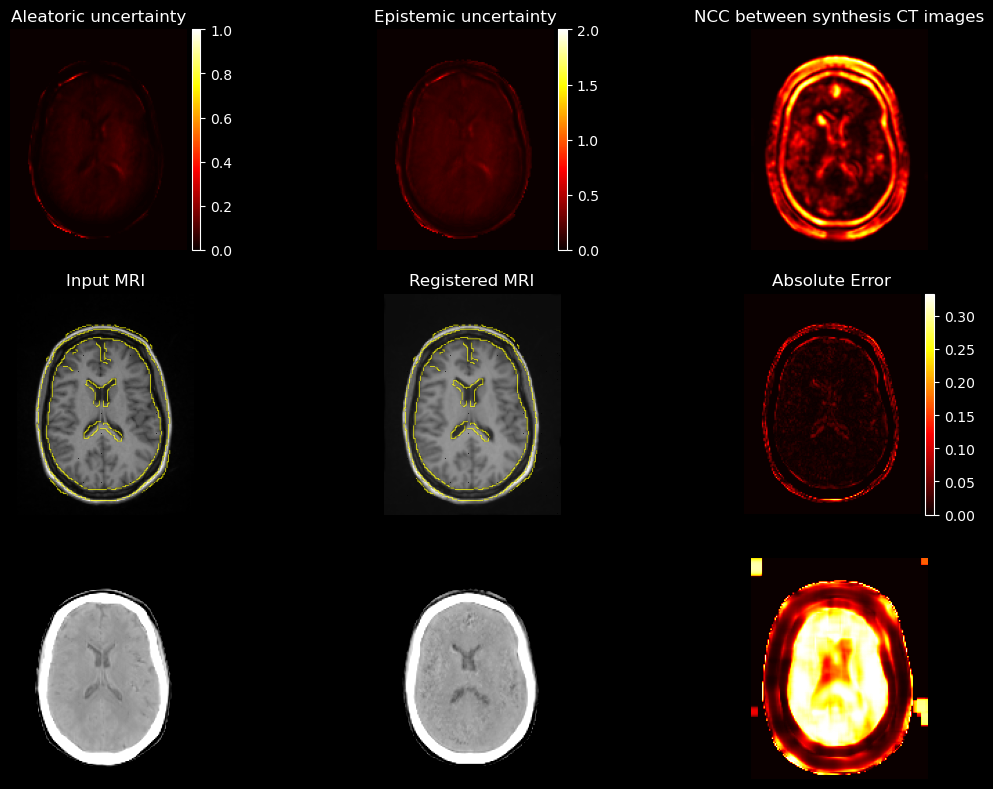

 20%|██        | 2/10 [00:24<01:38, 12.36s/it]

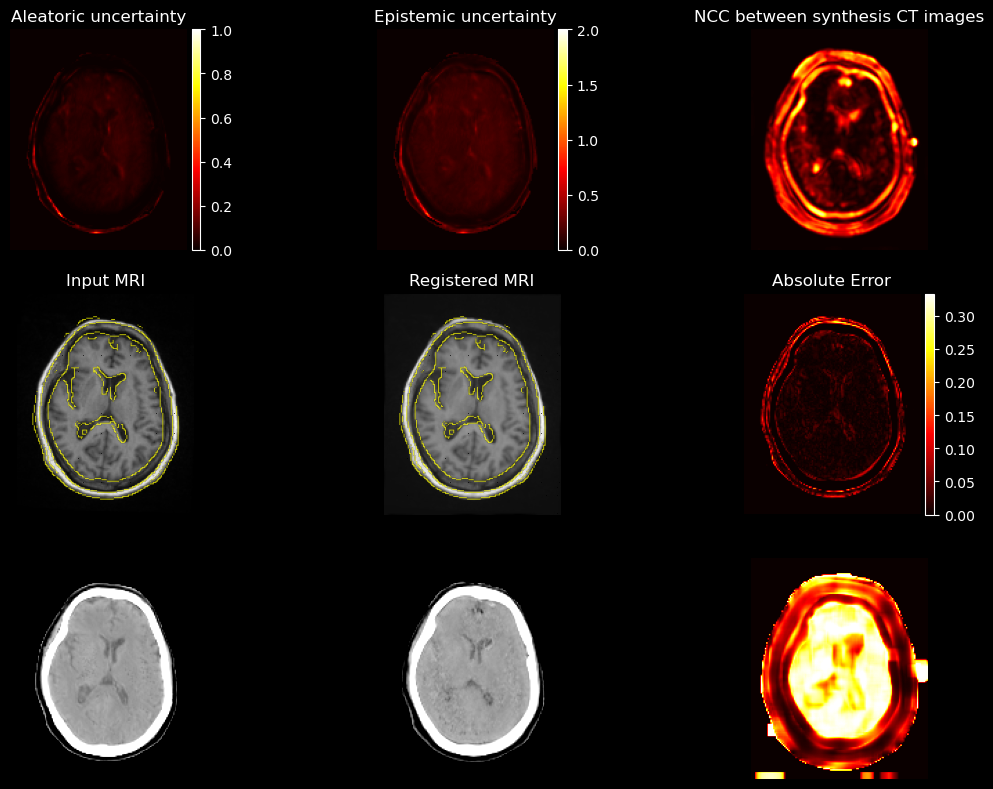

 30%|███       | 3/10 [00:36<01:26, 12.34s/it]

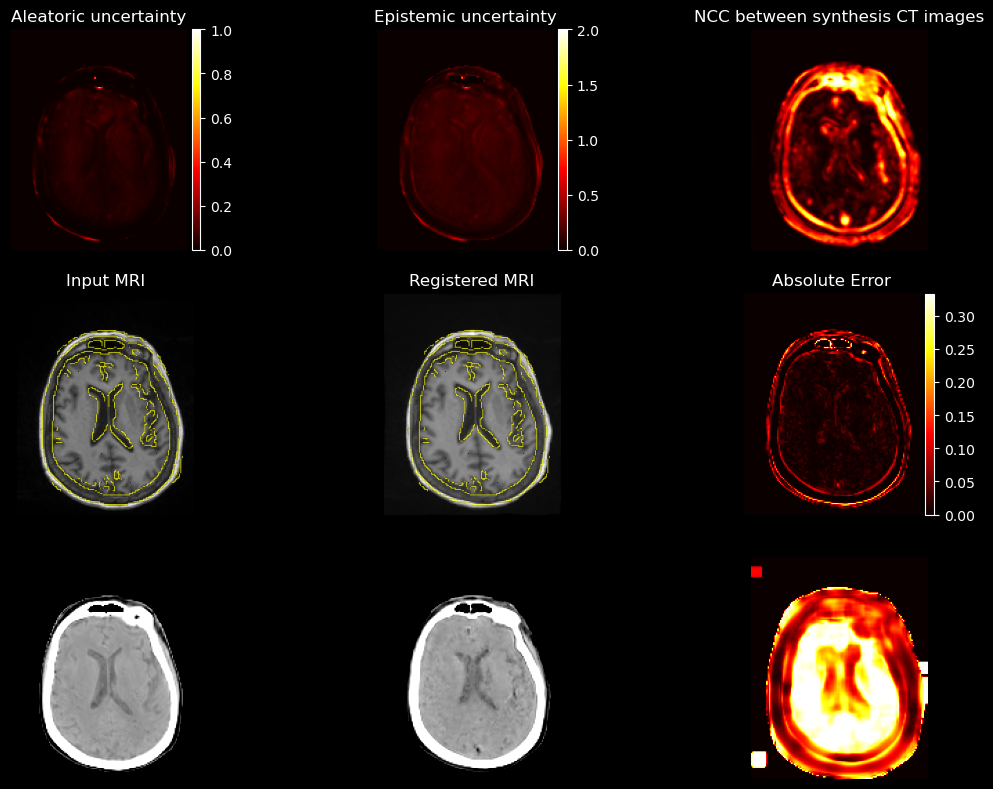

 40%|████      | 4/10 [00:49<01:13, 12.31s/it]

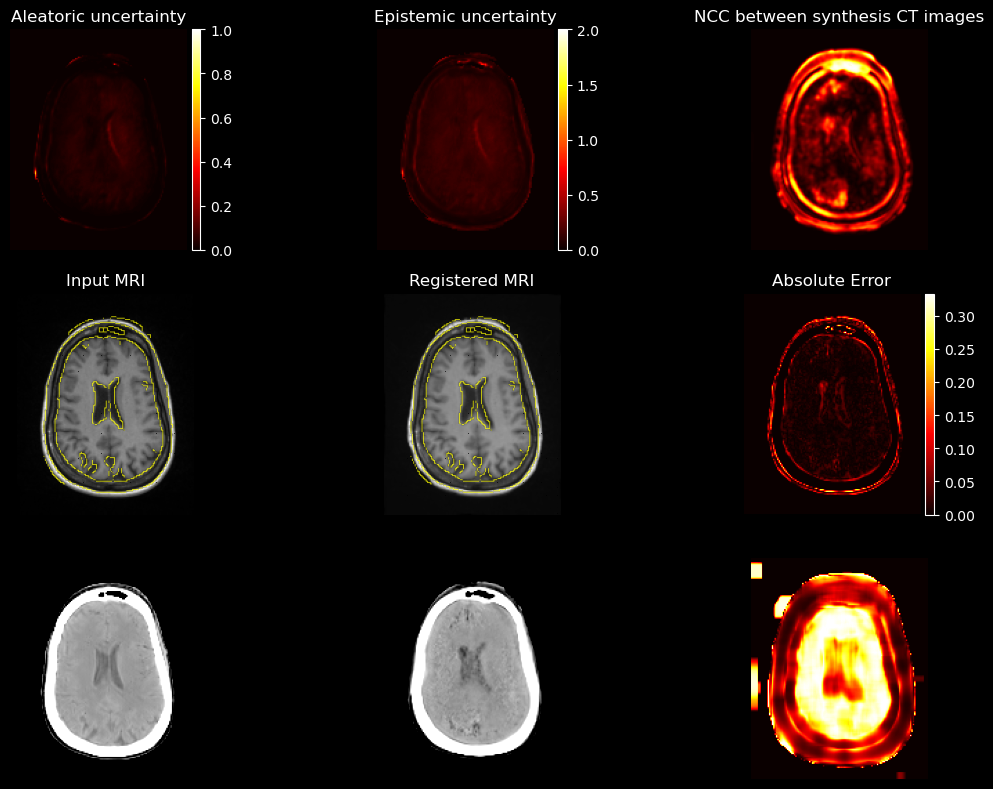

 50%|█████     | 5/10 [01:01<01:01, 12.28s/it]

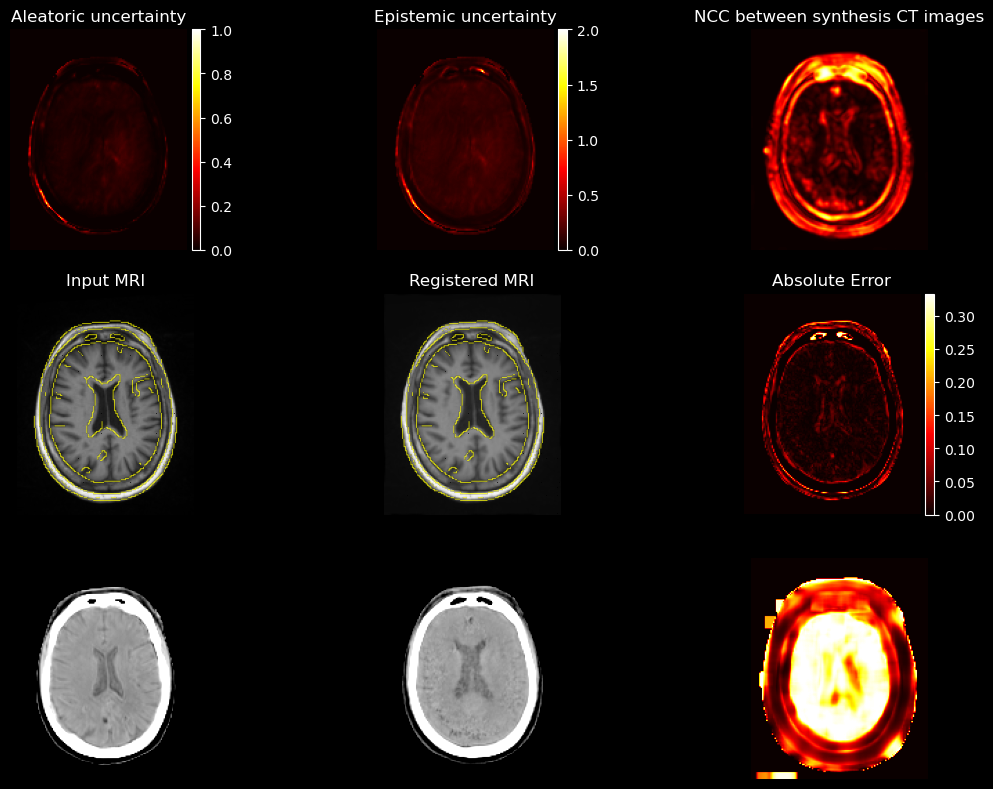

 60%|██████    | 6/10 [01:13<00:49, 12.39s/it]

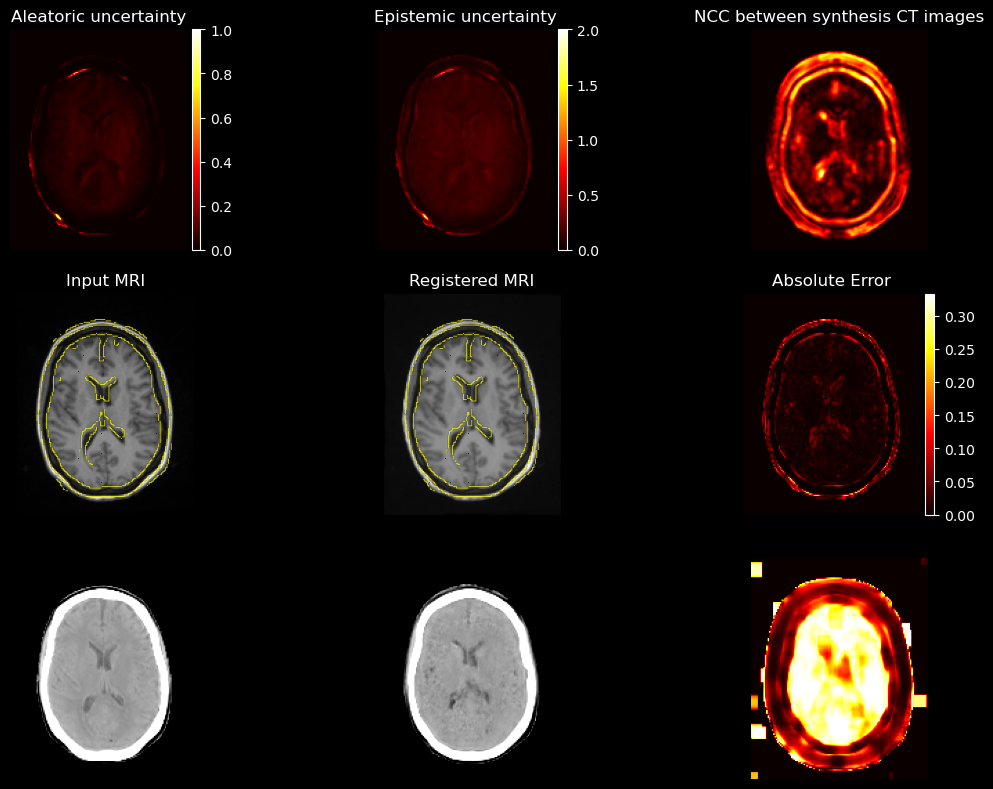

 70%|███████   | 7/10 [01:26<00:36, 12.32s/it]

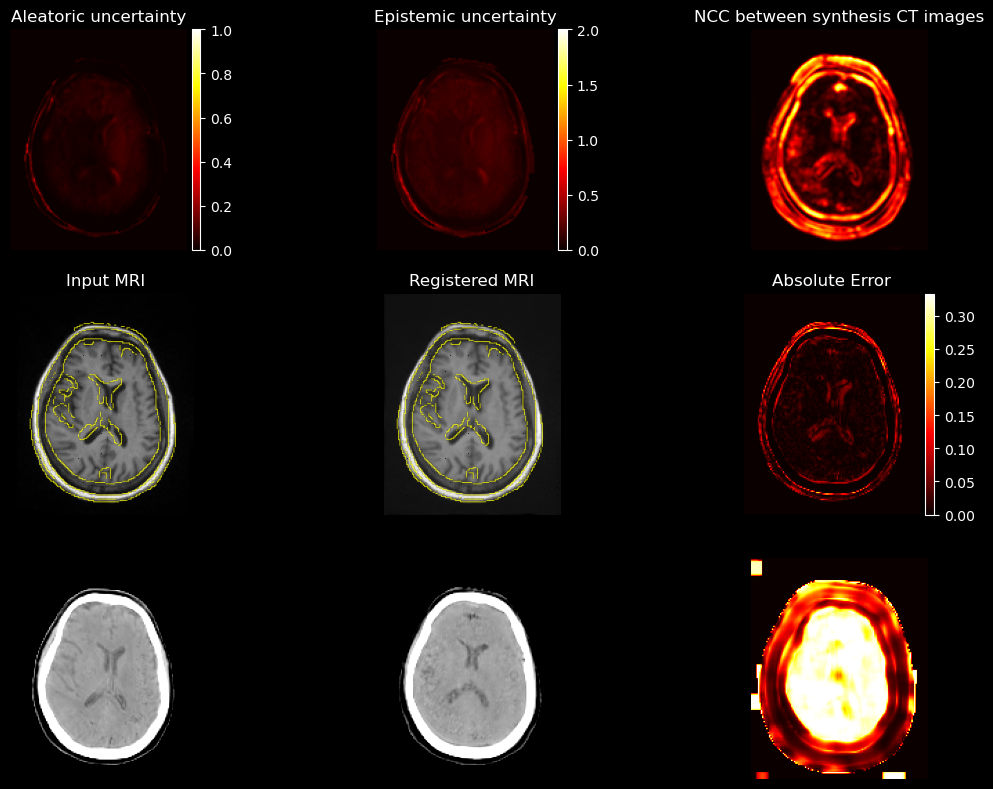

 80%|████████  | 8/10 [01:38<00:24, 12.20s/it]

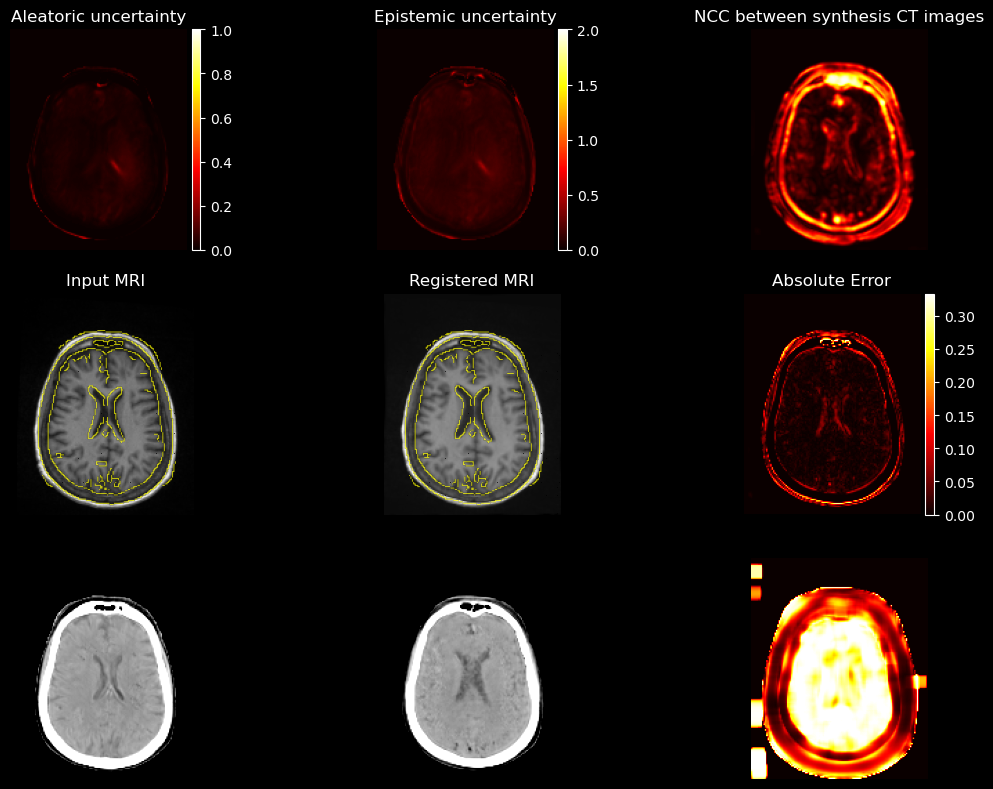

 90%|█████████ | 9/10 [01:50<00:12, 12.17s/it]

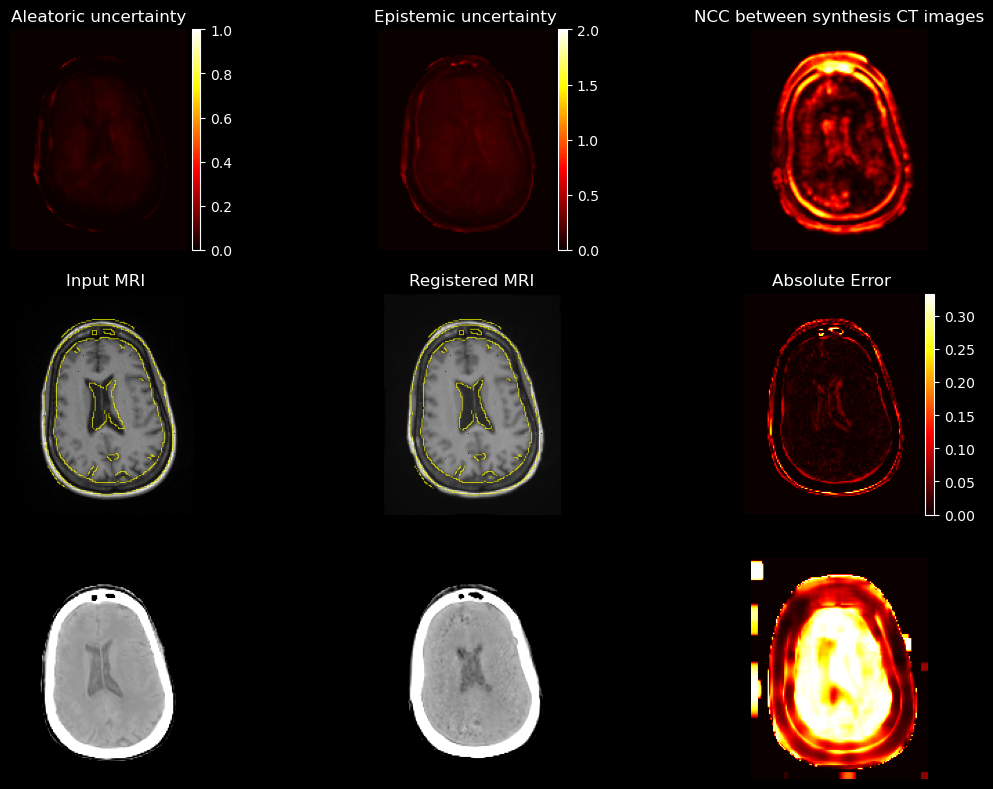

100%|██████████| 10/10 [02:01<00:00, 12.20s/it]


In [21]:
for i in tqdm(range(10)):
    data = valid_dataset[i]
    cbct_fixed = data[0].to(device).to(device)
    mr_moving = data[1].to(device).to(device)
    ct_fixed = data[2].unsqueeze(0).unsqueeze(0).to(device)
    ct_moving = data[3].unsqueeze(0).unsqueeze(0).to(device)
    with torch.no_grad():
#         _, ct_moving_synth, ct_fixed_synth = G(mr_moving, cbct_fixed)
        flows,mr_syn,cbct_syn= G(mr_moving, cbct_fixed)
        # sim = 1-torch.nn.AvgPool3d(kernel_size=3, stride = 1, padding =1 )(mr_syn[0]*cbct_syn[0]).numpy()
        
        mr_reg = vxm.layers.SpatialTransformer([128,160,128], mode='bilinear').to(device)(mr_moving, flows[0])
        pred = flows[0]
        sim = MIND_metric((128 ,160,128),d=1, patch_size=7, use_gaussian_kernel=True,device = 'cpu').loss(cbct_syn[0],mr_reg)
        NCC = 1+NCC_metric(device = 'cpu').loss(cbct_syn[0],mr_syn[0])
        uncert = flows[4]
        alpha_x = uncert[0,0,:,:,:]+1
        beta_x = uncert[0,1,:,:,:]
        mu_x = uncert[0,2,:,:,:]
        omega_x = 2*beta_x*(1+mu_x) 
    alea_x = beta_x/(alpha_x-1)

    epi_x = beta_x/(mu_x*(alpha_x-1))

    islice = 70
    mask_head = (cbct_fixed[0,0,:,:,islice].cpu().numpy()>0.05).astype(int)
    fig, ax = plt.subplots(3,3,figsize=(12,8))
    np.vectorize(lambda ax: ax.axis('off'))(ax)
    alx = (alea_x.cpu().numpy()[0,:,:,islice]*mask_head).T
    
    ex = (epi_x.cpu().numpy()[0,:,:,islice]*mask_head).T

    imx1 = ax[0][0].imshow(alx, cmap='hot', vmin=0, vmax = 1)
    # ax[0][0].imshow(canny(ct_fixed.cpu().numpy()[0,0,:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
    divider = make_axes_locatable(ax[0][0])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imx1, cax=cax, orientation='vertical')
    ax[0][0].set_title('Aleatoric uncertainty')
    

    imx2 = ax[0][1].imshow(ex+alx, cmap='hot', vmin=0, vmax = 2)
    # ax[0][1].imshow(canny(ct_fixed.cpu().numpy()[0,0,:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
    divider = make_axes_locatable(ax[0][1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imx2, cax=cax, orientation='vertical')
    ax[0][1].set_title('Epistemic uncertainty')

    # ax[1][0].imshow(cbct_syn[0][0,0,:,:,islice].T, cmap='gray')
    ax[1][0].imshow(mr_moving[0,0,:,:,islice].T, cmap='gray')
    ax[1][0].imshow(canny(ct_fixed.cpu().numpy()[0,0,:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
    ax[1][0].set_title('Input MRI') 
    
    # ax[1][1].imshow(mr_syn[0][0,0,:,:,islice].T, cmap='gray')
    ax[1][1].imshow(mr_reg[0,0,:,:,islice].T, cmap='gray')
    ax[1][1].imshow(canny(ct_fixed.cpu().numpy()[0,0,:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
    ax[1][1].set_title('Registered MRI')

    ax[1][2].imshow(abs(cbct_syn[0][0,0,:,:,islice].T-mr_syn[0][0,0,:,:,islice].T), cmap='hot',vmax =1)
    # imz9 = ax[1][2].imshow(abs(mr_gt[0,0,:,:,islice].T-mr_reg[0,0,:,:,islice].T), cmap='hot')
    ax[1][2].set_title('Absolute Error')
    
    divider = make_axes_locatable(ax[1][2])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imz9, cax=cax, orientation='vertical')

    
    # imy1 = ax[0][2].imshow(1.5*(abs_mag[:,:,islice]*mask_head).T, cmap='hot',vmax = 8)
    # divider = make_axes_locatable(ax[0][2])
    # cax = divider.append_axes('right', size='5%', pad=0.05)
    # fig.colorbar(imy1, cax=cax, orientation='vertical')
    ax[0][2].imshow(sim[0,0,:,:,islice].T,cmap = 'hot')
    # ax[0][2].imshow(canny(ct_fixed.cpu().numpy()[0,0,:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
    
    ax[0][2].set_title('NCC between synthesis CT images')
    
    ax[2][0].imshow(mr_syn[0][0,0,:,:,islice].T, cmap = 'gray', vmin = 0.2, vmax = 0.95)
    ax[2][1].imshow(cbct_syn[0][0,0,:,:,islice].T, cmap = 'gray', vmin = 0.2, vmax = 0.95)
    ax[2][2].imshow(NCC[0,0,:,:,islice].T, cmap = 'hot')
    
    plt.tight_layout()
    plt.show()

  0%|          | 0/10 [00:00<?, ?it/s]

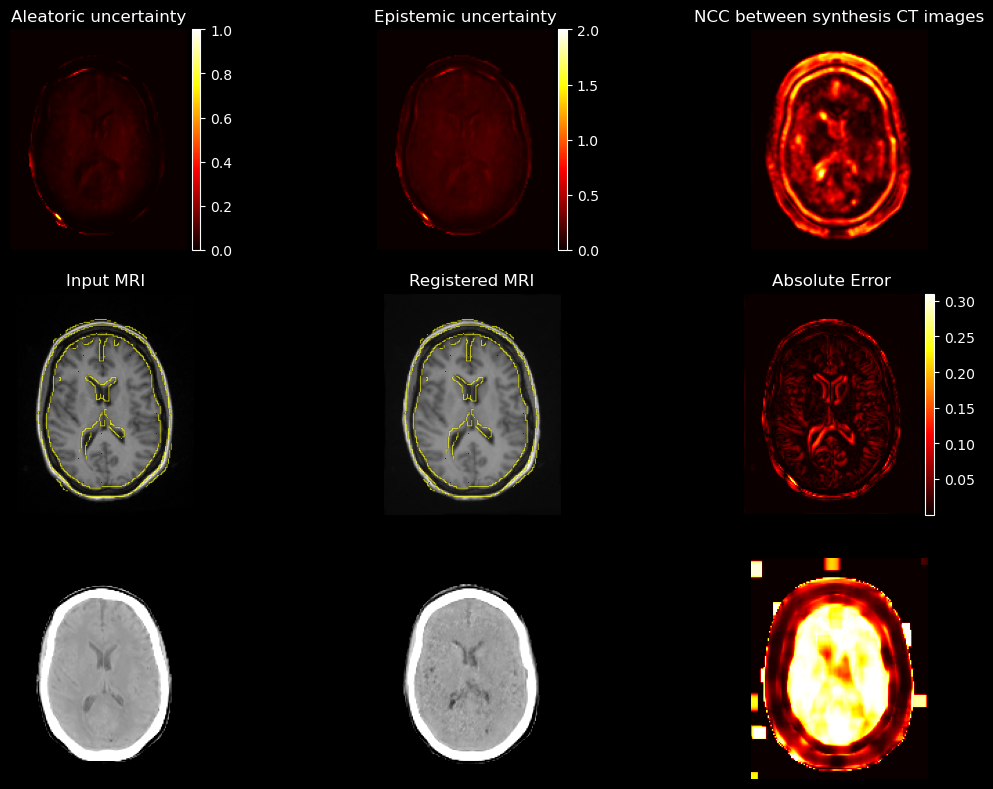

 10%|█         | 1/10 [00:12<01:53, 12.66s/it]

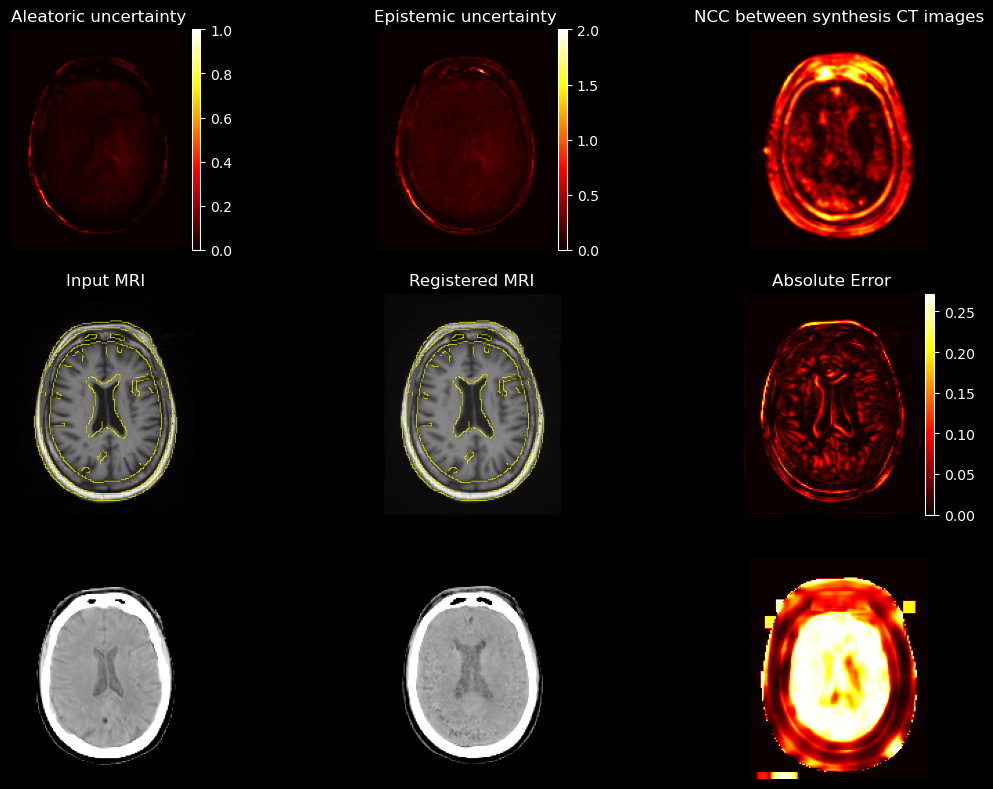

 20%|██        | 2/10 [00:25<01:42, 12.79s/it]

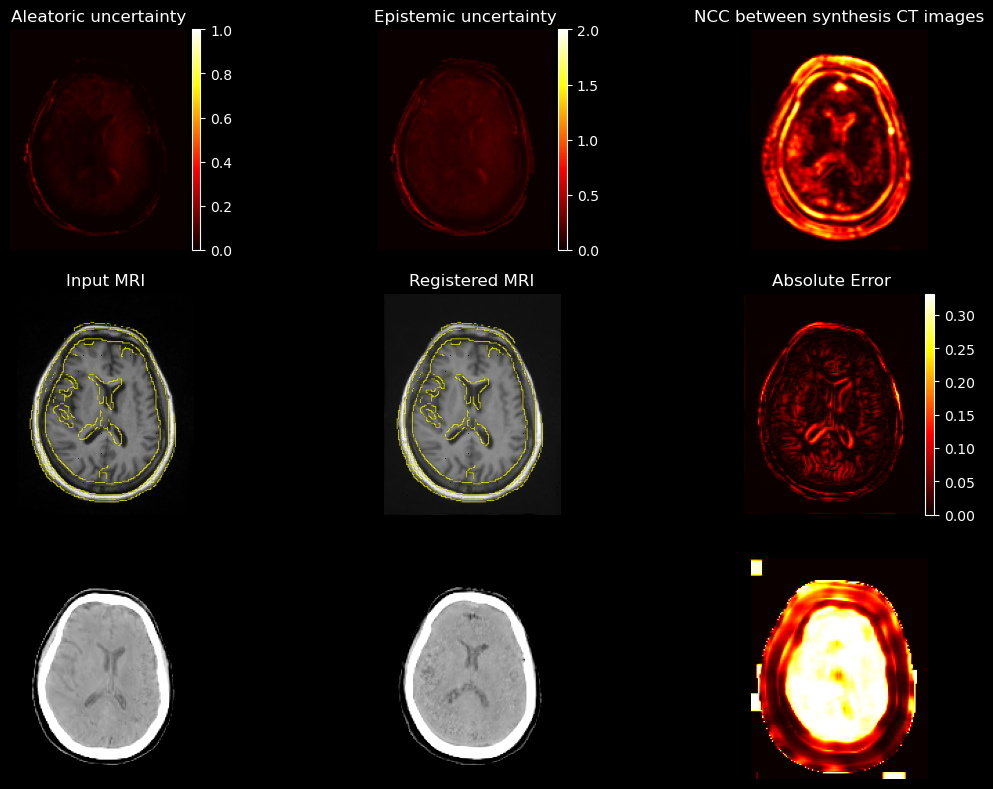

 30%|███       | 3/10 [00:37<01:27, 12.47s/it]

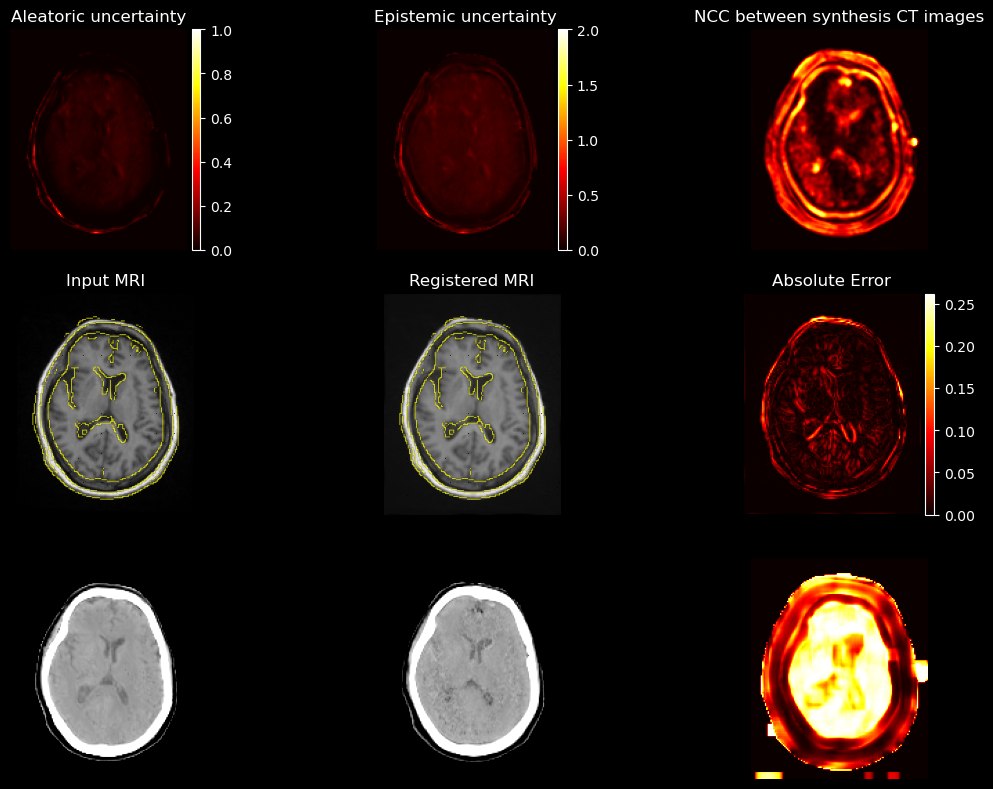

 40%|████      | 4/10 [00:49<01:13, 12.28s/it]

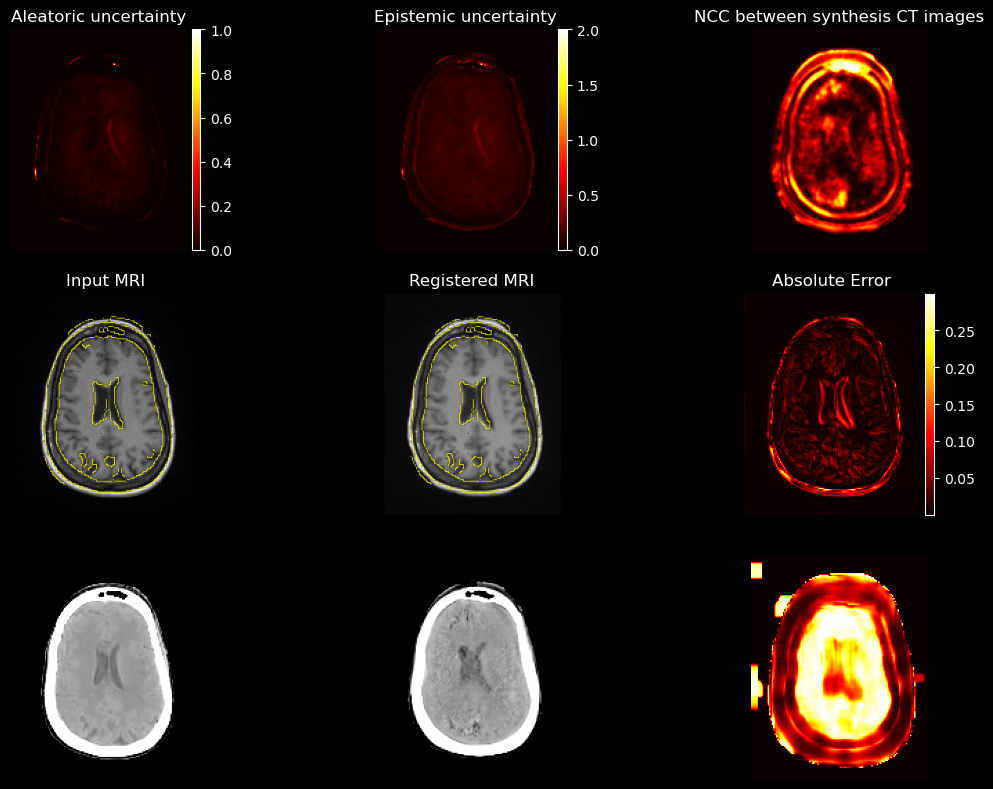

 50%|█████     | 5/10 [01:01<01:01, 12.27s/it]

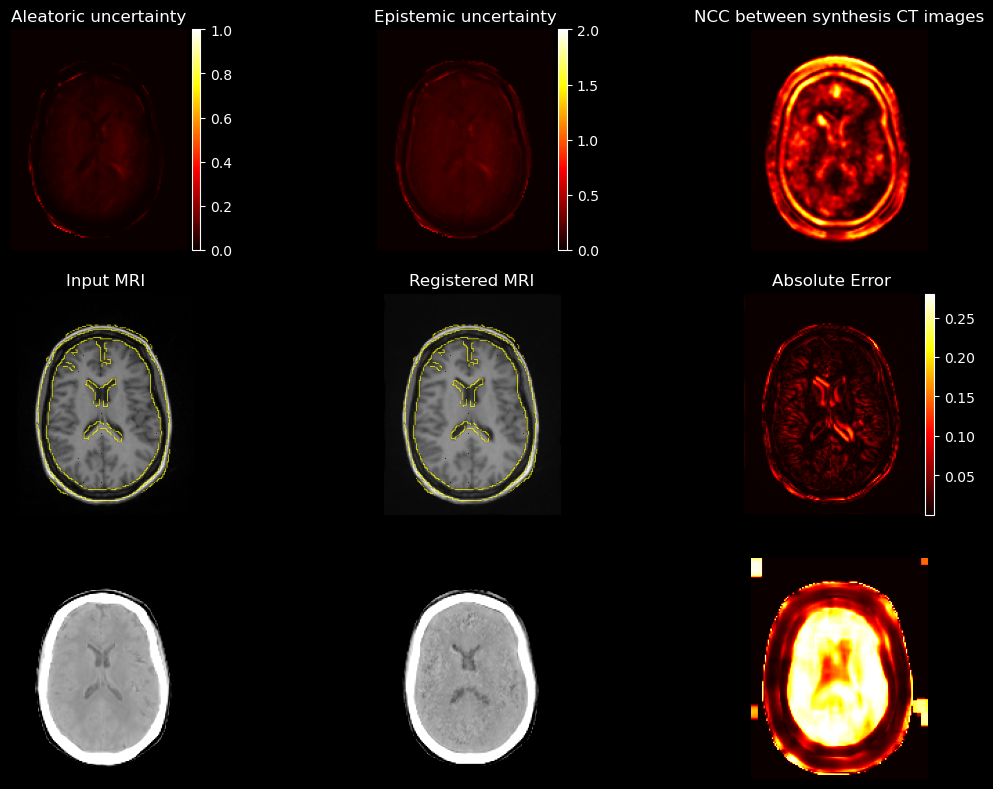

 60%|██████    | 6/10 [01:14<00:49, 12.29s/it]

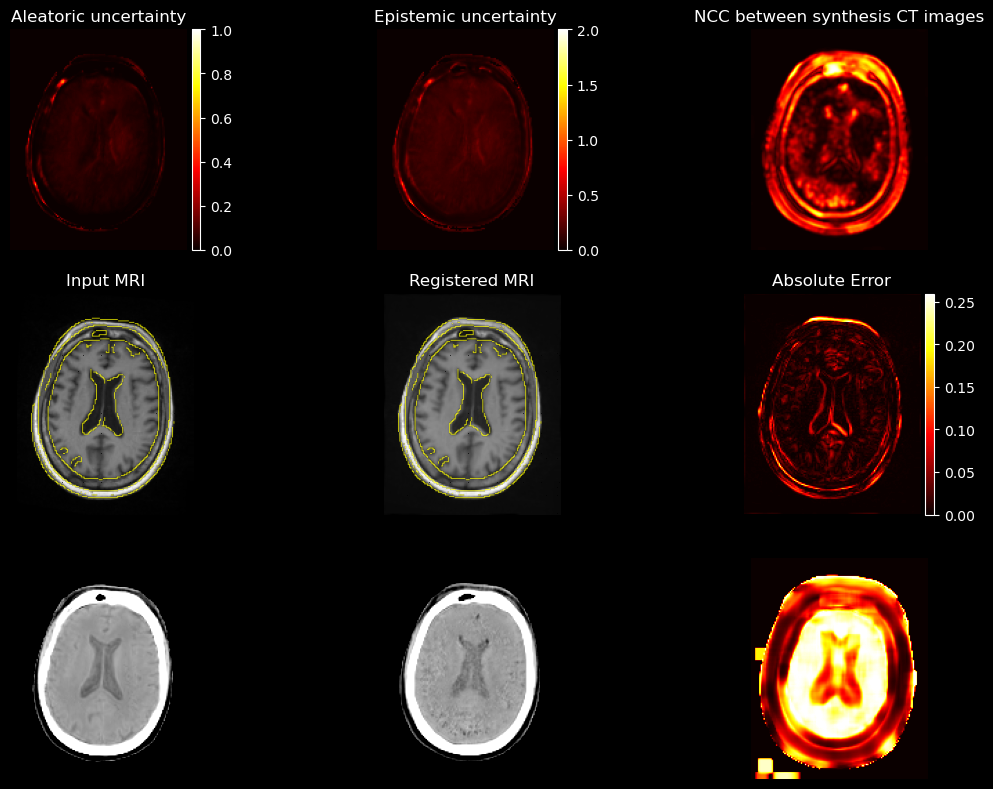

 70%|███████   | 7/10 [01:25<00:36, 12.01s/it]

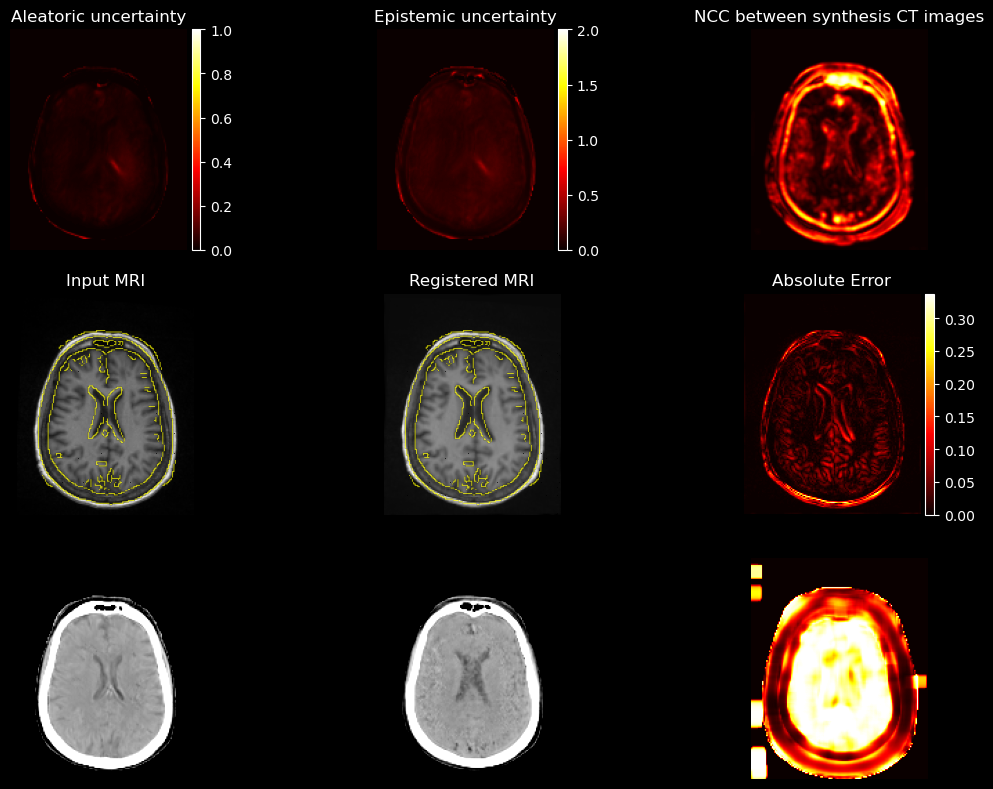

 80%|████████  | 8/10 [01:36<00:23, 11.76s/it]

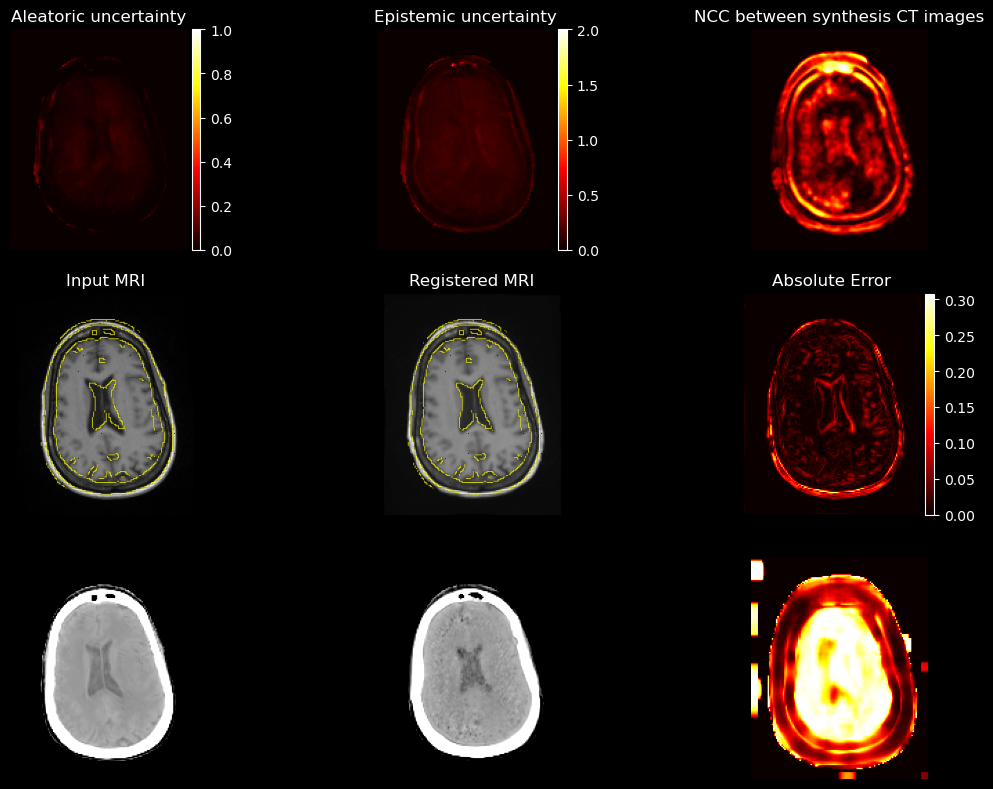

 90%|█████████ | 9/10 [01:49<00:11, 11.92s/it]

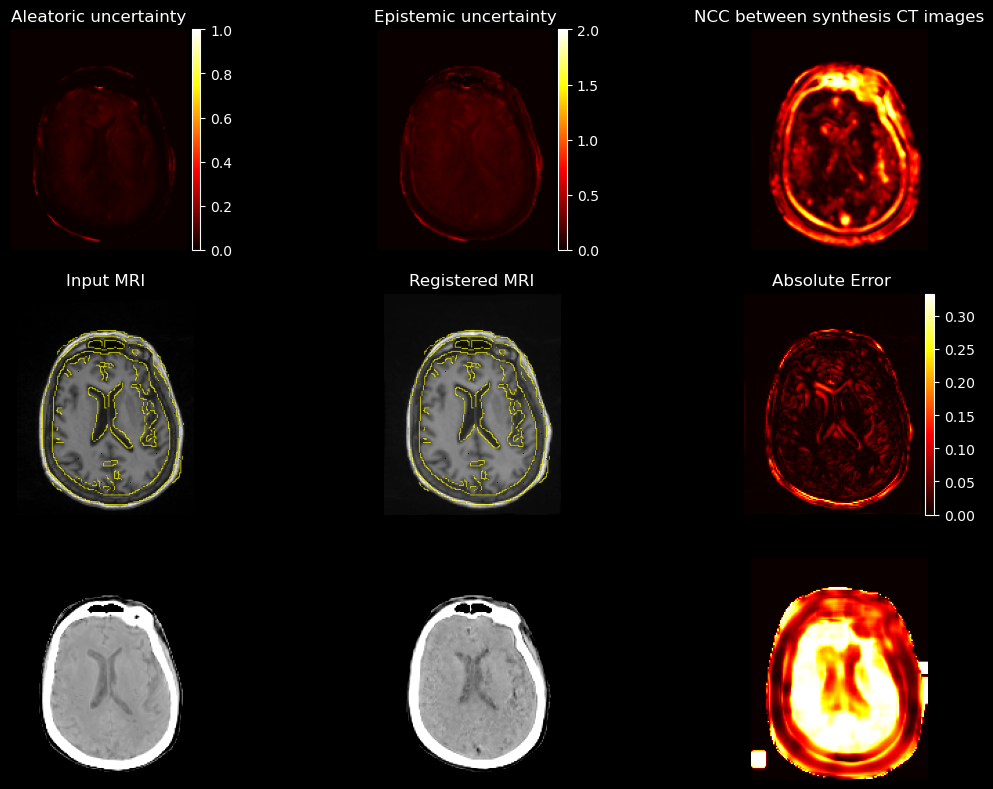

100%|██████████| 10/10 [02:01<00:00, 12.19s/it]


In [8]:
for i in tqdm(range(10)):
    data = valid_dataset[i]
    cbct_fixed = data[0].to(device).to(device)
    mr_moving = data[1].to(device).to(device)
    ct_fixed = data[2].unsqueeze(0).unsqueeze(0).to(device)
    ct_moving = data[3].unsqueeze(0).unsqueeze(0).to(device)
    mr_gt = data[-2]
    flow_gt = torch.from_numpy(data[-1])
    tru_mag =(flow_gt[0,0,:,:,:]**2+flow_gt[0,1,:,:,:]**2+flow_gt[0,2,:,:,:]**2)**0.5
    # mr = torch.from_numpy(resize(mr,[128,160,128],order=3)).to(device)
    with torch.no_grad():
#         _, ct_moving_synth, ct_fixed_synth = G(mr_moving, cbct_fixed)
        flows,mr_syn,cbct_syn= G(mr_moving, cbct_fixed)
        # sim = 1-torch.nn.AvgPool3d(kernel_size=3, stride = 1, padding =1 )(mr_syn[0]*cbct_syn[0]).numpy()
        
        mr_reg = vxm.layers.SpatialTransformer([128,160,128], mode='bilinear').to(device)(mr_moving, flows[0])
        pred = flows[0]
        pred_mag =(pred[0,0,:,:,:]**2+pred[0,1,:,:,:]**2+pred[0,2,:,:,:]**2)**0.5
        sim = MIND_metric((128 ,160,128),d=1, patch_size=7, use_gaussian_kernel=True,device = 'cpu').loss(cbct_syn[0],mr_reg)
        NCC = 1+NCC_metric(device = 'cpu').loss(cbct_syn[0],mr_syn[0])
        # print(sim.shape)
        # print(mind.shape)
        uncert = flows[4]
        alpha_x = uncert[0,0,:,:,:]+1
        beta_x = uncert[0,1,:,:,:]
        mu_x = uncert[0,2,:,:,:]
        omega_x = 2*beta_x*(1+mu_x) 
    abs_mag = abs(tru_mag-pred_mag) 
    alea_x = beta_x/(alpha_x-1)

    epi_x = beta_x/(mu_x*(alpha_x-1))

    islice = 70
    mask_head = (cbct_fixed[0,0,:,:,islice].cpu().numpy()>0.05).astype(int)
    fig, ax = plt.subplots(3,3,figsize=(12,8))
    np.vectorize(lambda ax: ax.axis('off'))(ax)
    alx = (alea_x.cpu().numpy()[0,:,:,islice]*mask_head).T
    
    ex = (epi_x.cpu().numpy()[0,:,:,islice]*mask_head).T

    imx1 = ax[0][0].imshow(alx, cmap='hot', vmin=0, vmax = 1)
    # ax[0][0].imshow(canny(ct_fixed.cpu().numpy()[0,0,:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
    divider = make_axes_locatable(ax[0][0])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imx1, cax=cax, orientation='vertical')
    ax[0][0].set_title('Aleatoric uncertainty')
    

    imx2 = ax[0][1].imshow(ex+alx, cmap='hot', vmin=0, vmax = 2)
    # ax[0][1].imshow(canny(ct_fixed.cpu().numpy()[0,0,:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
    divider = make_axes_locatable(ax[0][1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imx2, cax=cax, orientation='vertical')
    ax[0][1].set_title('Epistemic uncertainty')

    # ax[1][0].imshow(cbct_syn[0][0,0,:,:,islice].T, cmap='gray')
    ax[1][0].imshow(mr_moving[0,0,:,:,islice].T, cmap='gray')
    ax[1][0].imshow(canny(ct_fixed.cpu().numpy()[0,0,:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
    ax[1][0].set_title('Input MRI') 
    
    # ax[1][1].imshow(mr_syn[0][0,0,:,:,islice].T, cmap='gray')
    ax[1][1].imshow(mr_reg[0,0,:,:,islice].T, cmap='gray')
    ax[1][1].imshow(canny(ct_fixed.cpu().numpy()[0,0,:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
    ax[1][1].set_title('Registered MRI')

    ax[1][2].imshow(abs(cbct_syn[0][0,0,:,:,islice].T-mr_syn[0][0,0,:,:,islice].T), cmap='hot',vmax =1)
    imz9 = ax[1][2].imshow(abs(mr_gt[0,0,:,:,islice].T-mr_reg[0,0,:,:,islice].T), cmap='hot')
    ax[1][2].set_title('Absolute Error')
    
    divider = make_axes_locatable(ax[1][2])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imz9, cax=cax, orientation='vertical')

    
    # imy1 = ax[0][2].imshow(1.5*(abs_mag[:,:,islice]*mask_head).T, cmap='hot',vmax = 8)
    # divider = make_axes_locatable(ax[0][2])
    # cax = divider.append_axes('right', size='5%', pad=0.05)
    # fig.colorbar(imy1, cax=cax, orientation='vertical')
    ax[0][2].imshow(sim[0,0,:,:,islice].T,cmap = 'hot')
    # ax[0][2].imshow(canny(ct_fixed.cpu().numpy()[0,0,:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
    
    ax[0][2].set_title('NCC between synthesis CT images')
    
    ax[2][0].imshow(mr_syn[0][0,0,:,:,islice].T, cmap = 'gray', vmin = 0.2, vmax = 0.95)
    ax[2][1].imshow(cbct_syn[0][0,0,:,:,islice].T, cmap = 'gray', vmin = 0.2, vmax = 0.95)
    ax[2][2].imshow(NCC[0,0,:,:,islice].T, cmap = 'hot')
    
    plt.tight_layout()
    plt.show()

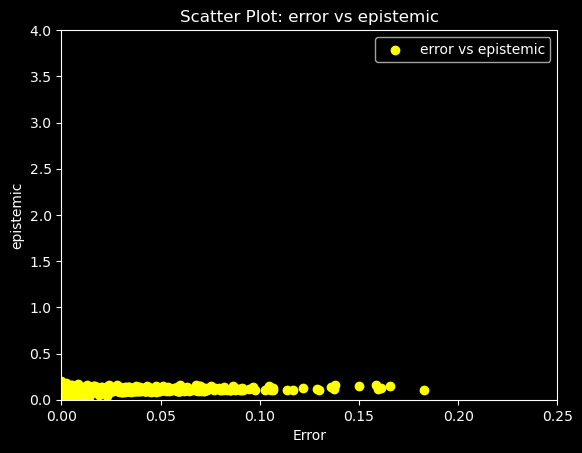

In [9]:
maxpooling = nn.MaxPool1d(kernel_size=8)

diff = abs(mr_gt[0,0,:,:,islice].T-mr_reg[0,0,:,:,islice].T)[52:76,60:100]
error =1.5*(abs_mag[:,:,islice]*mask_head).T[80:128,80:160]
# error_seg = maxpooling(error).numpy().flatten()
# error_p = error[64:128,80:160]
# uncert_Seg = maxpooling(torch.from_numpy(alx+ex))
uncert = (ex)[52:76,60:100]
plt.scatter(diff, uncert, label='error vs epistemic', color='yellow')
plt.xlabel('Error')
plt.ylabel('epistemic')
plt.title('Scatter Plot: error vs epistemic')

# Adding a legend
plt.legend()
plt.xlim((0, 0.25))
plt.ylim((0, 4))

# Displaying the plot
plt.show()

  0%|          | 0/10 [00:00<?, ?it/s]

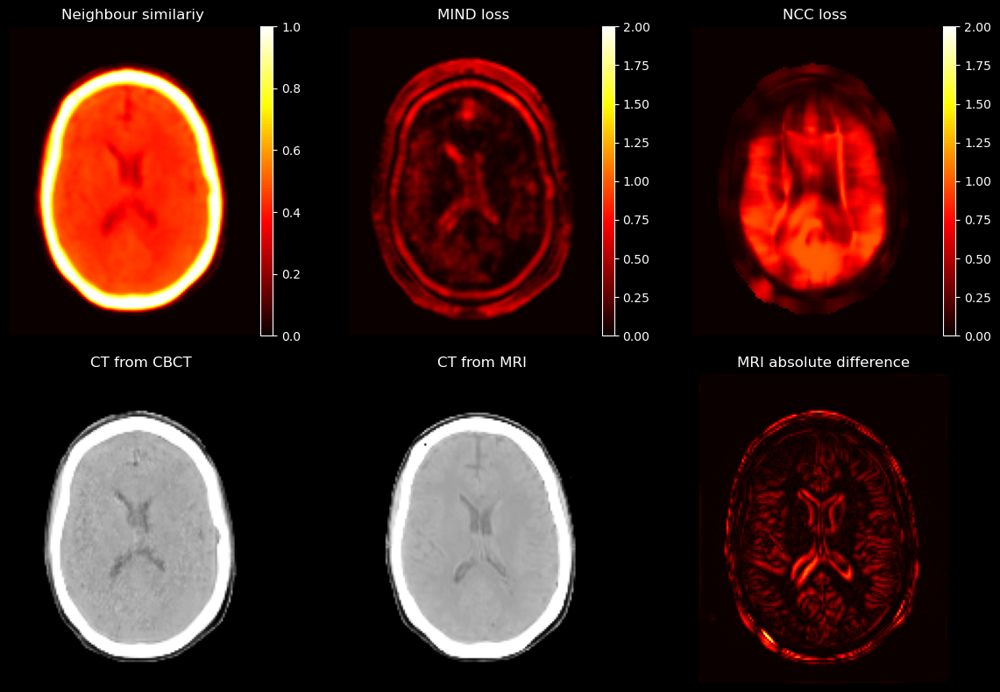

 10%|█         | 1/10 [00:11<01:47, 11.97s/it]

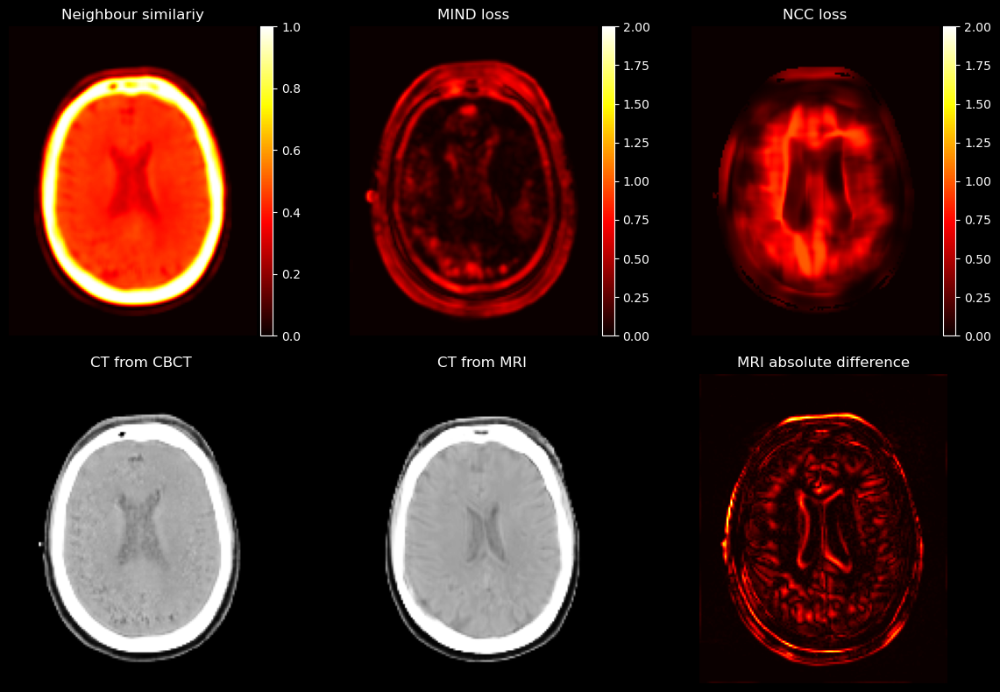

 20%|██        | 2/10 [00:23<01:34, 11.84s/it]

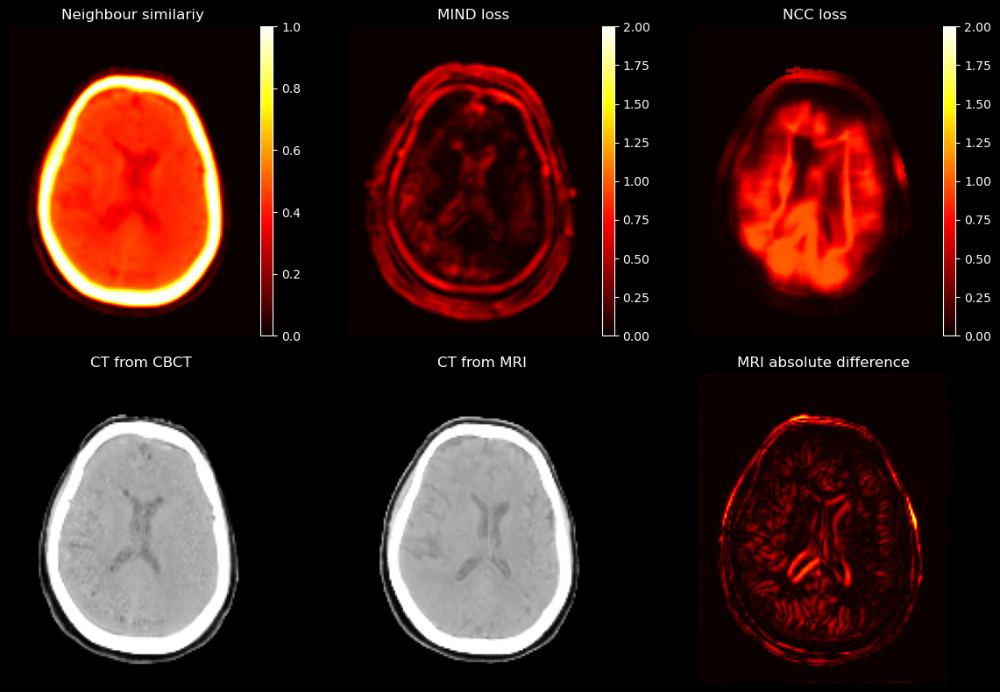

 30%|███       | 3/10 [00:35<01:23, 11.92s/it]

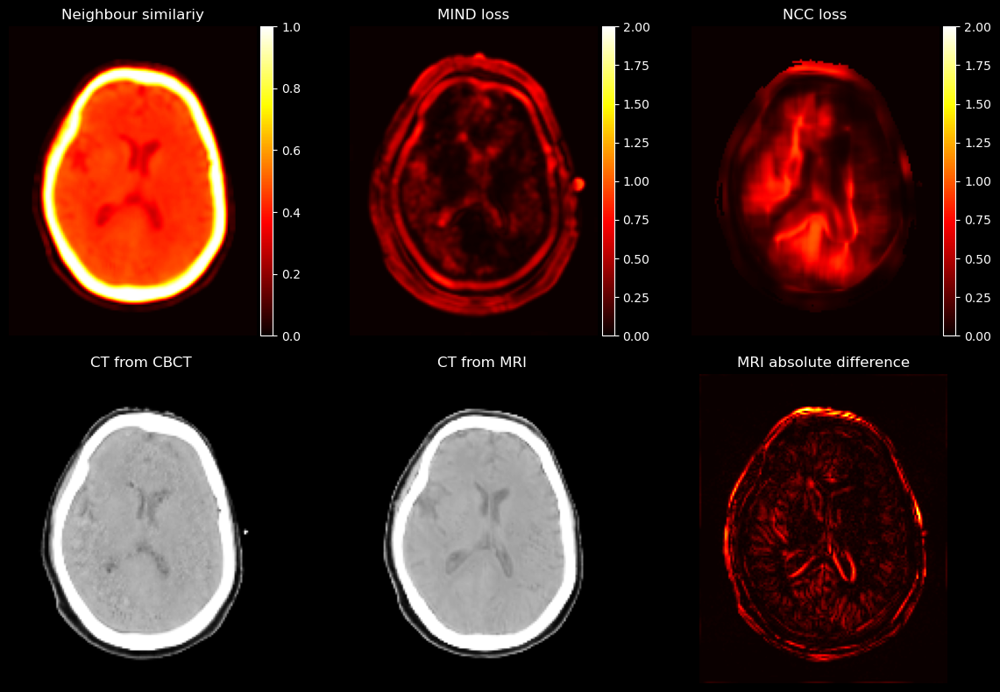

 40%|████      | 4/10 [00:47<01:11, 11.97s/it]

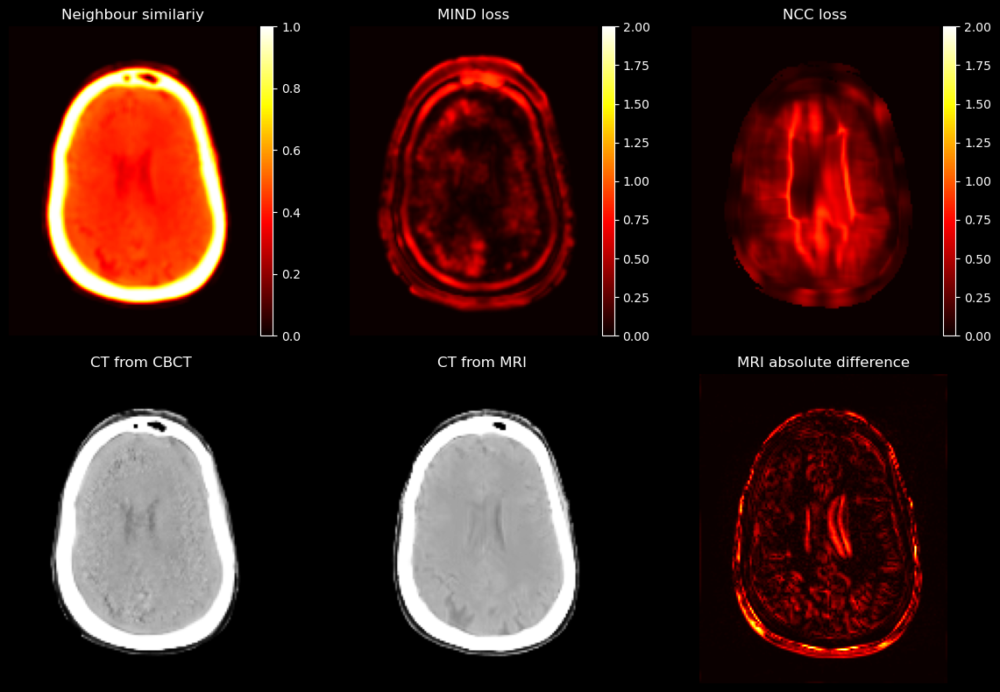

 50%|█████     | 5/10 [00:59<00:58, 11.79s/it]

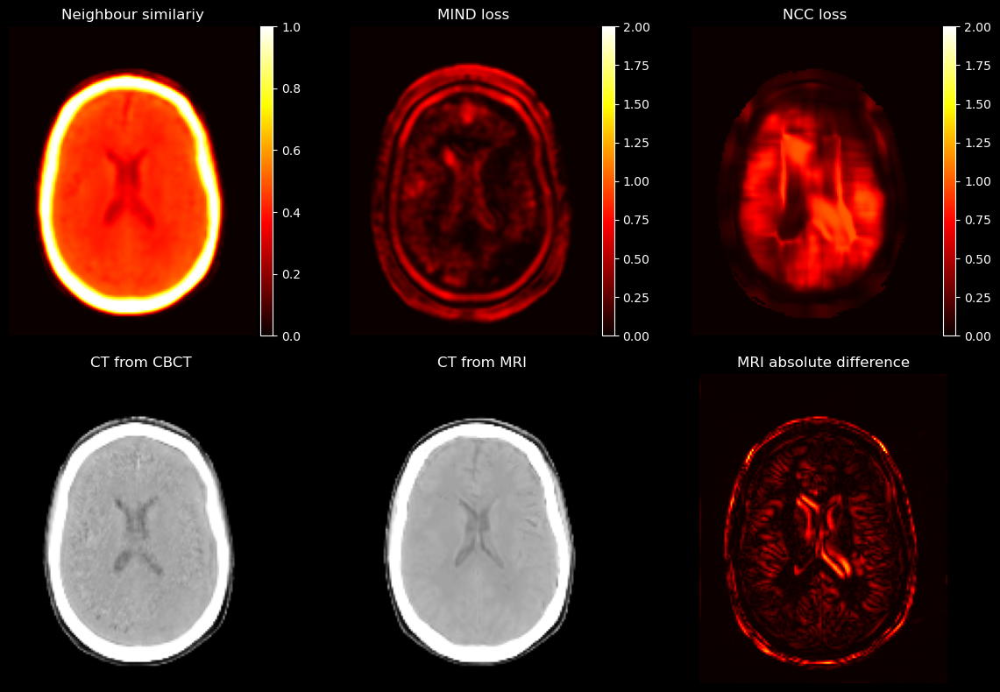

 60%|██████    | 6/10 [01:10<00:46, 11.61s/it]

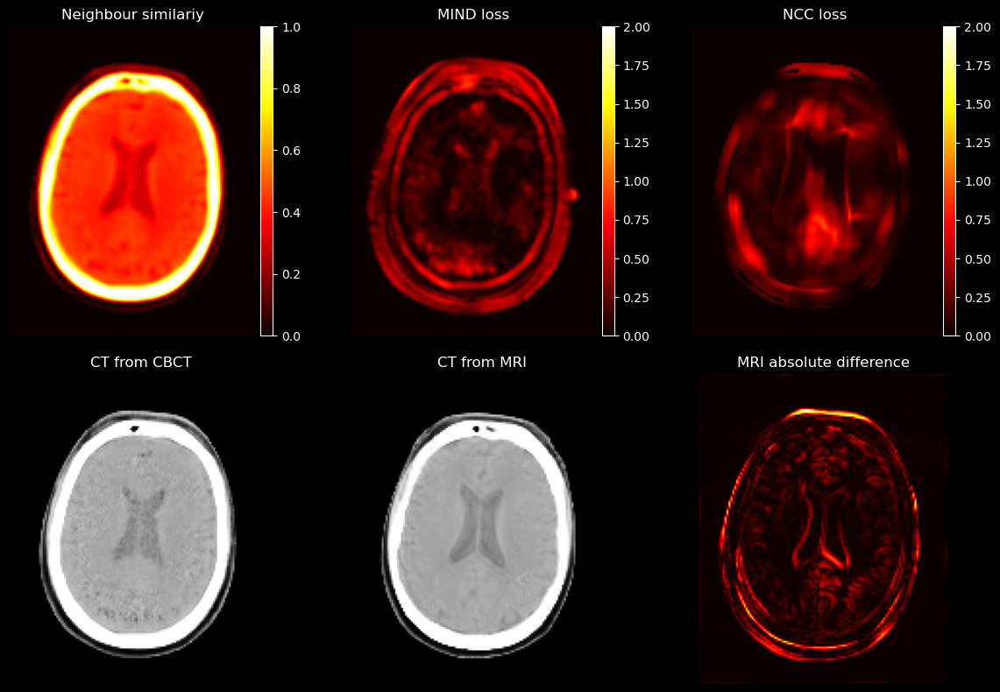

 70%|███████   | 7/10 [01:21<00:34, 11.49s/it]

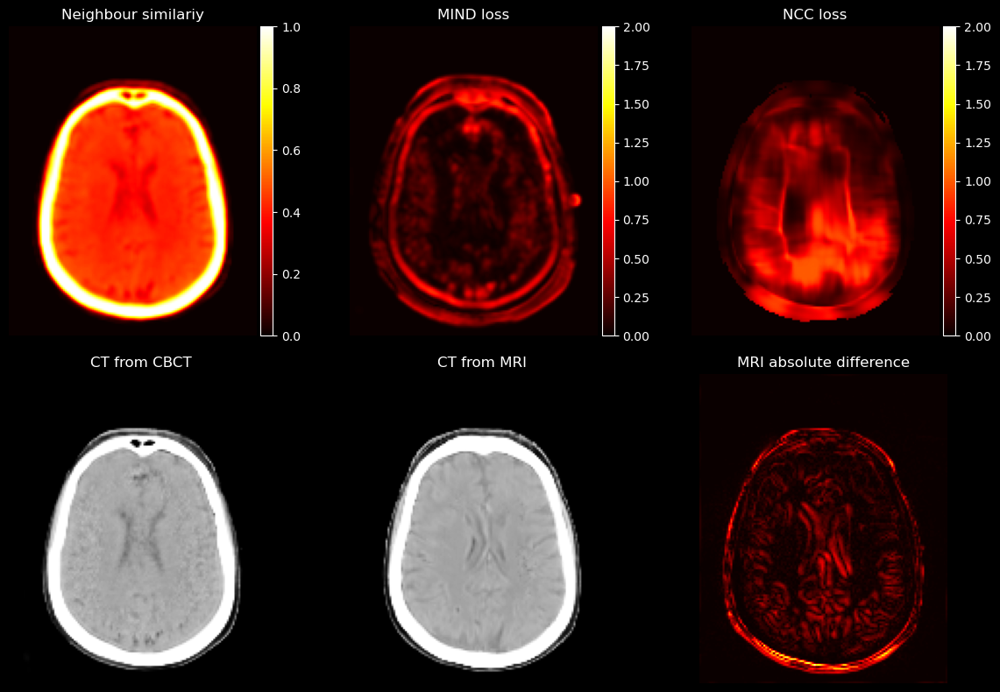

 80%|████████  | 8/10 [01:33<00:23, 11.72s/it]

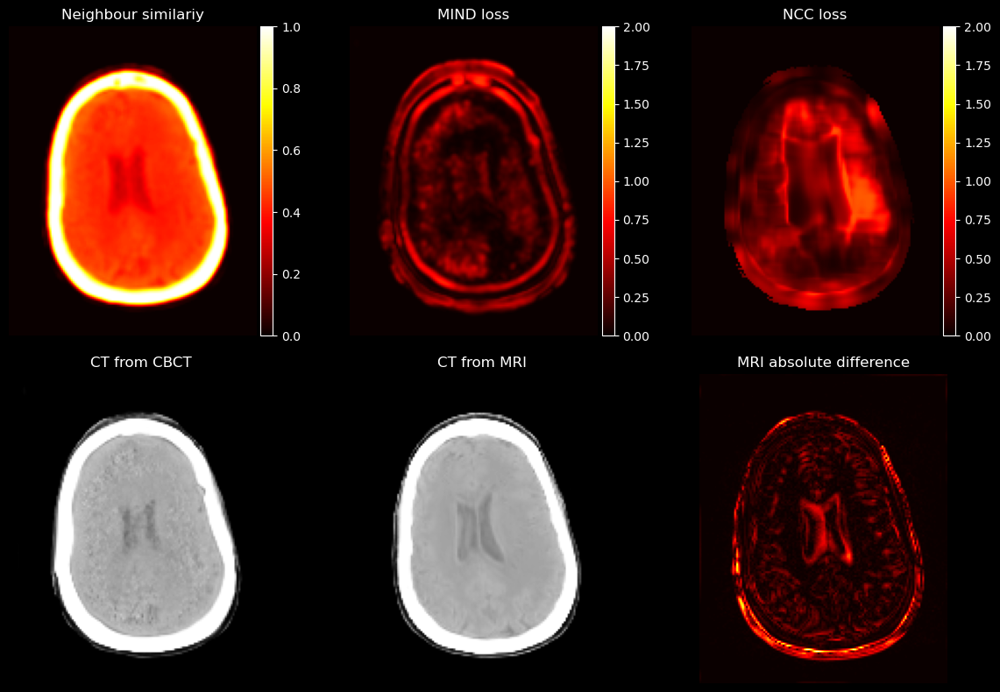

 90%|█████████ | 9/10 [01:45<00:11, 11.64s/it]

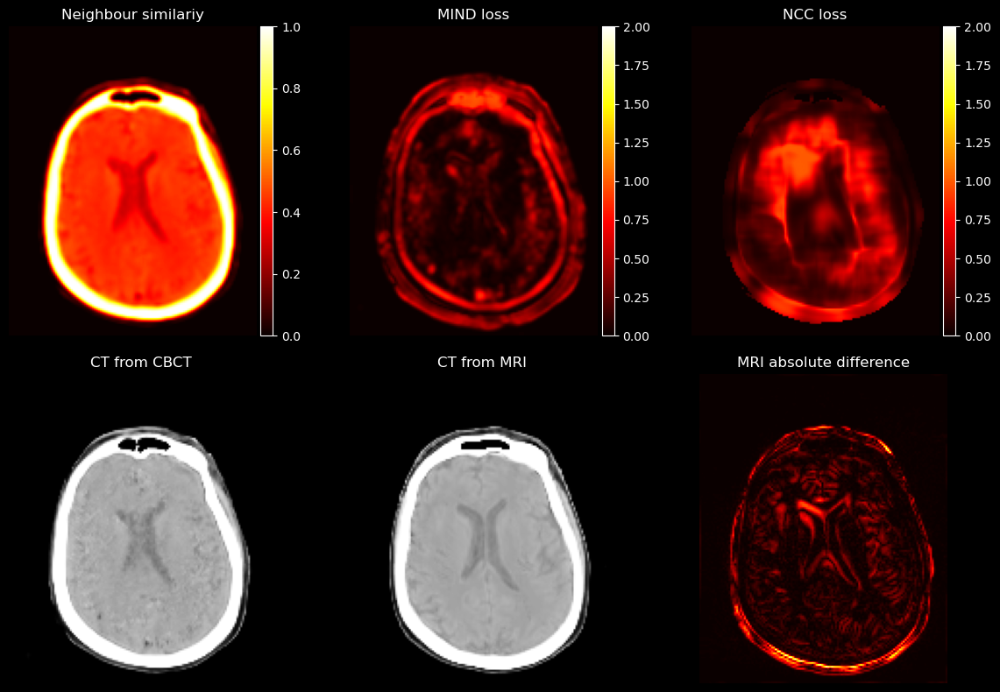

100%|██████████| 10/10 [01:57<00:00, 11.72s/it]


In [10]:
for i in tqdm(range(10)):
    data = valid_dataset[i]
    cbct_fixed = data[0].to(device).to(device)
    mr_moving = data[1].to(device).to(device)
    ct_fixed = data[2].unsqueeze(0).unsqueeze(0).to(device)
    ct_moving = data[3].unsqueeze(0).unsqueeze(0).to(device)
    mr_gt = data[-2]
    # mr = torch.from_numpy(resize(mr,[128,160,128],order=3)).to(device)
    with torch.no_grad():
#         _, ct_moving_synth, ct_fixed_synth = G(mr_moving, cbct_fixed)
        flows,mr_syn,cbct_syn= G(mr_moving, cbct_fixed)
        sim = torch.nn.AvgPool3d(kernel_size=3, stride = 1, padding =1 )(mr_syn[0]*cbct_syn[0]).numpy()
        
        mr_reg = vxm.layers.SpatialTransformer([128,160,128], mode='bilinear').to(device)(mr_moving, flows[0])
        mind = MIND_metric((128,160,128),d=1, patch_size=7, use_gaussian_kernel=True,device = 'cpu').loss(cbct_syn[0],mr_reg)
        ncc = 1+NCC_metric(device = 'cpu').loss(mr_gt,mr_reg)
        # print(sim.shape)
        # print(mind.shape)

    islice = 72
    mask_head = (cbct_fixed[0,0,:,:,islice].cpu().numpy()>0.05).astype(int)
    fig, ax = plt.subplots(2,3,figsize=(12,8))
    np.vectorize(lambda ax: ax.axis('off'))(ax)

    imx1 = ax[0][0].imshow(sim[0,0,:,:,islice].T, cmap='hot', vmin=0, vmax = 1)
    # ax[0][0].imshow(canny(ct_fixed.cpu().numpy()[0,0,:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
    divider = make_axes_locatable(ax[0][0])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imx1, cax=cax, orientation='vertical')
    ax[0][0].set_title('Neighbour similariy')
    

    imx2 = ax[0][1].imshow(mind[0,0,:,:,islice].T, cmap='hot', vmin=0, vmax = 2)
    # ax[0][1].imshow(canny(ct_fixed.cpu().numpy()[0,0,:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
    divider = make_axes_locatable(ax[0][1])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imx2, cax=cax, orientation='vertical')
    ax[0][1].set_title('MIND loss')

    ax[1][0].imshow(cbct_syn[0][0,0,:,:,islice].T, cmap='gray')
    ax[1][0].set_title('CT from CBCT') 
    # ax[1][0].imshow(mr_gt[0,0,:,:,islice].T, cmap='gray')
    # ax[1][0].set_title('Input MRI') 
    
    ax[1][1].imshow(mr_syn[0][0,0,:,:,islice].T, cmap='gray')
    ax[1][1].set_title('CT from MRI')
    # ax[1][1].imshow(mr_reg[0,0,:,:,islice].T, cmap='gray')
    # ax[1][1].set_title('Registered MRI')

    # ax[1][2].imshow(abs(cbct_syn[0][0,0,:,:,islice].T-mr_syn[0][0,0,:,:,islice].T), cmap='hot',vmax =1)
    ax[1][2].imshow(abs(mr_gt[0,0,:,:,islice].T-mr_reg[0,0,:,:,islice].T), cmap='hot')
    ax[1][2].set_title('MRI absolute difference')
    
    imy1 = ax[0][2].imshow((ncc[0,0,:,:,islice]*mask_head).T, cmap='hot',vmax = 2)
    # ax[0][2].imshow(canny(ct_fixed.cpu().numpy()[0,0,:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
    divider = make_axes_locatable(ax[0][2])
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(imy1, cax=cax, orientation='vertical')
    ax[0][2].set_title('NCC loss')
    
    plt.tight_layout()
    plt.show()

In [11]:
metrics = pd.DataFrame()
mask_val = [1,2,23,5,19,29,8]
# valid_dataset = RadOncTrainingDataset("/home/myi16/jsr_Y/new_val", num_samples=10, transform=False,
#                                           supervision=True, return_segmentation=True)
print(len(valid_dataset))
for ep in range(1):
    G.load_state_dict(checkpoint['G_state_dict'])
    dice_before_total = []
    dice_after_total = []
    hd_before_total = []
    sd_before_total = []
    hd_after_total = []
    sd_after_total = []
    tre_before_total = []
    tre_after_total = []
    
    for i in range(10):
        # cbct_fixed, mr_moving, ct_fixed, ct_moving, seg_fixed, seg_moving, gt,gt_mr = valid_dataset[i]
        cbct_fixed, mr_moving, ct_fixed, ct_moving, seg_fixed, seg_moving = valid_dataset[i]
        cbct_fixed = cbct_fixed.float().to(device)
        mr_moving = mr_moving.float().to(device)
        ct_fixed = ct_fixed.float().to(device)
        ct_moving = ct_moving.float().to(device)
        seg_fixed = seg_fixed.float().to(device)
        seg_moving = seg_moving.float().to(device)
        # print('cbct:',cbct_fixed.min(),cbct_fixed.max())
        # print('mr:',mr_moving.min(),mr_moving.max())
        # print('ct_fixed:',ct_fixed.min(),ct_fixed.max())
        # print('ct_moving:',ct_moving.min(),ct_moving.max())
        # print('seg_moving:',seg_moving.min(),seg_moving.max())
        # print('seg_fixed:',seg_fixed.min(),seg_fixed.max())
        
        
        
        # cbct_fixed = torch.from_numpy(cbct_fixed).to(device).unsqueeze(0).unsqueeze(0).to(device)
        # mr_moving = torch.from_numpy(mr_moving).to(device).unsqueeze(0).unsqueeze(0).to(device)
        # ct_fixed = torch.from_numpy(ct_fixed).to(device)
        # ct_moving = torch.from_numpy(ct_moving).to(device)
        # seg_fixed =  torch.from_numpy(seg_fixed).float().unsqueeze(0).to(device)
        # seg_moving =  torch.from_numpy(seg_moving).float().unsqueeze(0).to(device)
        
        # print(cbct_fixed.shape, mr_moving.shape, ct_fixed.shape, ct_moving.shape, seg_fixed.shape, seg_moving.shape)
        # torch.Size([1, 1, 128, 160, 128]) torch.Size([1, 1, 128, 160, 128]) torch.Size([128, 160, 128]) torch.Size([128, 160, 128]) torch.Size([1, 7, 128, 160, 128]) torch.Size([1, 7, 128, 160, 128])
        with torch.no_grad():
            flow, ct_moving_synth, ct_fixed_synth = G(mr_moving, cbct_fixed)
            # print(ct_moving_synth[0].max(),ct_moving_synth[0].min())
            # print(ct_fixed_synth[0].max(),ct_fixed_synth[0].min())
            # the flow[0] means the final highest resolution from the cascade network.
            mr_reg = vxm.layers.SpatialTransformer([128,160,128], mode='bilinear').to(device)(mr_moving, flow[0])
            ct_reg_synth = vxm.layers.SpatialTransformer([128,160,128], mode='bilinear').to(device)(ct_moving_synth[0], flow[0])
            seg_reg = vxm.layers.SpatialTransformer([128,160,128], mode='nearest').to(device)(seg_moving, flow[0])

            dice_before = []
            hd_before = []
            sd_before = []
            dice_after= []
            hd_after = []
            sd_after = []
            for j, val in enumerate(mask_val):
                mask_fixed = seg_fixed[:,j:j+1,:,:,:]
                mask_moving = seg_moving[:,j:j+1,:,:,:]
                mask_registered = seg_reg[:,j:j+1,:,:,:]
                dice_before.append(-losses.Dice().loss(mask_fixed,mask_moving).item())
                dice_after.append(-losses.Dice().loss(mask_fixed,mask_registered).item())
                metrics_before = compute_surface_metrics(np.squeeze(mask_fixed.squeeze().cpu().numpy())==1, np.squeeze(mask_moving.squeeze().cpu().numpy())==1)
                metrics_after = compute_surface_metrics(np.squeeze(mask_fixed.squeeze().cpu().numpy())==1, np.squeeze(mask_registered.squeeze().cpu().numpy())==1)
                hd_before.append(metrics_before['hd'])
                hd_after.append(metrics_after['hd'])
                sd_before.append(metrics_before['avg_dist'])
                sd_after.append(metrics_after['avg_dist'])
                
            valid_ds = np.load(glob.glob(os.path.join("/mnt/blackhole-data2/RadOnc_Brain/Validation",'*.npz'))[i])
            seg_fixed = valid_ds['ventricle_fixed']
            seg_moving = valid_ds['ventricle_moving']
            seg_fixed = torch.from_numpy(resize(seg_fixed, [128,160,128], order=0, anti_aliasing=False)).unsqueeze(0).unsqueeze(0).to(device)
            seg_moving = torch.from_numpy(resize(seg_moving, [128,160,128], order=0, anti_aliasing=False)).unsqueeze(0).unsqueeze(0).to(device)
            seg_reg = vxm.layers.SpatialTransformer([128,160,128], mode='nearest').to(device)(seg_moving, flow[0])
            tre_before_total.append(compute_TRE(seg_fixed.squeeze().cpu().numpy(), seg_moving.squeeze().cpu().numpy(), [1,1,1]).mean())
            tre_after_total.append(compute_TRE(seg_fixed.squeeze().cpu().numpy(), seg_reg.squeeze().cpu().numpy(), [1,1,1]).mean())
            dice_before_total.append(dice_before)
            dice_after_total.append(dice_after)
            hd_before_total.append(hd_before)
            hd_after_total.append(hd_after)
            sd_before_total.append(sd_before)
            sd_after_total.append(sd_after)
            
            # islice = 72
            # fig, ax = plt.subplots(2,2,figsize=(9,6))
            # np.vectorize(lambda ax: ax.axis('off'))(ax)
            # ax[0,0].imshow(cbct_fixed.cpu().numpy()[0,0,islice,:,:].T, cmap='gray')
            # ax[0,0].set_title('Input CBCT',fontdict={'fontsize': 18})
        
            
            # ax[0,1].imshow(ct_fixed.cpu().numpy()[islice,:,:].T, cmap='gray', vmin=0.4, vmax=0.95)
            # ax[0,1].imshow(canny(ct_fixed.cpu().numpy()[:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            # ax[0,1].set_title('Input CT',fontdict={'fontsize': 18})
            

            # ax[1,0].imshow(mr_moving.cpu().numpy()[0,0,islice,:,:].T, cmap='gray')
            # ax[1,0].imshow(canny(ct_fixed.cpu().numpy()[:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            # ax[1,0].set_title('Input MRI',fontdict={'fontsize': 18})

            
            # ax[1,1].imshow(mr_reg.cpu().numpy()[0,0,islice,:,:].T, cmap='gray')
            # ax[1,1].imshow(canny(ct_fixed.cpu().numpy()[:,:,islice].T, sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            # ax[1,1].set_title('Deformed MRI',fontdict={'fontsize': 18})
            
            # plt.tight_layout()
            # plt.show()
            # fig, ax = plt.subplots(2,4,figsize=(18,12))
            # np.vectorize(lambda ax: ax.axis('off'))(ax)
            # ax[0,0].imshow(np.flip(cbct_fixed.cpu().numpy()[0,0,islice,:,:].T), cmap='gray')
            # ax[0,0].set_title('Input CBCT',fontdict={'fontsize': 18})
            
            # ax[0,1].imshow(np.flip(ct_fixed_synth[0].cpu().numpy()[0,0,islice,:,:].T), cmap='gray', vmin=0.4, vmax=0.95)
            # ax[0,1].imshow(canny(np.flip(ct_fixed.cpu().numpy()[islice,:,:].T), sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            # ax[0,1].set_title('CT syhthesis from CBCT',fontdict={'fontsize': 18})
            
            # ax[0,2].imshow(np.flip(ct_fixed.cpu().numpy()[islice,:,:].T), cmap='gray', vmin=0.4, vmax=0.95)
            # ax[0,2].imshow(canny(np.flip(ct_fixed.cpu().numpy()[islice,:,:].T), sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            # ax[0,2].set_title('Input CT',fontdict={'fontsize': 18})
            
            # ax[0,3].imshow(np.flip(ct_reg_synth.cpu().numpy()[0,0,islice,:,:].T), cmap='gray', vmin=0.4, vmax=0.95)
            # ax[0,3].imshow(canny(np.flip(ct_fixed.cpu().numpy()[islice,:,:].T), sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            # ax[0,3].set_title('Deformed CT syhthesis from CBCT',fontdict={'fontsize': 18})

            # ax[1,0].imshow(np.flip(mr_moving.cpu().numpy()[0,0,islice,:,:].T), cmap='gray')
            # ax[1,0].imshow(canny(np.flip(ct_fixed.cpu().numpy()[islice,:,:].T), sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            # ax[1,0].set_title('Input MRI',fontdict={'fontsize': 18})
            
            # ax[1,1].imshow(np.flip(ct_moving_synth[0].cpu().numpy()[0,0,islice,:,:].T), cmap='gray', vmin=0.4, vmax=0.95)
            # ax[1,1].imshow(canny(np.flip(ct_fixed.cpu().numpy()[islice,:,:].T), sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            # ax[1,1].set_title('CT syhthesis from MRI',fontdict={'fontsize': 18})
            
            # ax[1,2].imshow(np.flip(ct_moving.cpu().numpy()[islice,:,:].T), cmap='gray', vmin=0.4, vmax=0.95)
            # ax[1,2].imshow(canny(np.flip(ct_fixed.cpu().numpy()[islice,:,:].T), sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            # ax[1,2].set_title('Input deformed CT',fontdict={'fontsize': 18})
            
            # ax[1,3].imshow(np.flip(mr_reg.cpu().numpy()[0,0,islice,:,:].T), cmap='gray')
            # ax[1,3].imshow(canny(np.flip(ct_fixed.cpu().numpy()[a].T), sigma=1), cmap=colormap_binary('yellow', alpha=0.7))
            # ax[1,3].set_title('Deformed MRI',fontdict={'fontsize': 18})
            
            # plt.tight_layout()
            # plt.show()
           
    if ep == 0:
        d0 = {'Dice':np.reshape(np.array(dice_before_total),-1), 'HD':np.reshape(np.array(hd_before_total),-1), 'SD':np.reshape(np.array(sd_before_total),-1), 
              'anatomy':['3rd Ventricle', '4th Ventricle','Lateral Ventricles', 'Amygdala', 'Hippocampus', 'Thalamus', 'Caudate']*10, 'ep':[0]*70, 'method':['Rigid']*70}
        d0 = pd.DataFrame(data=d0)
        metrics = pd.concat([metrics, d0])

    d = {'Dice':np.reshape(np.array(dice_after_total),-1), 'HD':np.reshape(np.array(hd_after_total),-1), 'SD':np.reshape(np.array(sd_after_total),-1), 
         'anatomy':['3rd Ventricle', '4th Ventricle','Lateral Ventricles', 'Amygdala', 'Hippocampus', 'Thalamus', 'Caudate']*10, 'ep':[29+ep*10]*70, 'method':['JSR-Cascade']*70}
    d = pd.DataFrame(data=d)
    metrics = pd.concat([metrics, d])

10


ValueError: too many values to unpack (expected 6)

In [ ]:
sum_dice = 0
sum_hd = 0
sum_sd = 0
for name in ['3rd Ventricle', '4th Ventricle','Lateral Ventricles', 'Amygdala', 'Hippocampus', 'Thalamus', 'Caudate']:
    data = metrics[metrics['anatomy']==name]
    data = data[data['method']=='JSR-Cascade']
    sum_dice += data['Dice'].mean()
    sum_hd += data['HD'].mean()
    sum_sd += data['SD'].mean()
    Dice = data['Dice'].mean()
    
    HD = data['HD'].mean()
    SD = data['SD'].mean()
    print(name, Dice, HD, SD)

3rd Ventricle 0.5036399498581886 2.868218157855009 0.7073440100431829
4th Ventricle 0.6229036003351212 3.6518412055023584 0.5864237764699599
Lateral Ventricles 0.7781304478645324 4.359160492166228 0.5880895173446187
Amygdala 0.5696912288665772 3.1801907223585486 0.6368055416450127
Hippocampus 0.6343604564666748 3.309857632498479 0.6041396712681999
Thalamus 0.7841382682323456 3.8379423818554566 0.6792389150350824
Caudate 0.6483203530311584 3.419000552523886 0.5482705849990204


In [ ]:
meand = metrics[metrics['method']=='JSR-Cascade']
meand.mean()


/tmp/ipykernel_3825/3121558659.py:2: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  meand.mean()


Dice     0.648741
HD       3.518030
SD       0.621473
ep      29.000000
dtype: float64

In [ ]:
meand.to_csv('aft_unc_rz.csv',index = False)

In [ ]:
def plot_flow(flow, z, spacing=8, ax=None):
    def plot_grid(x,y, ax=ax, **kwargs):
        ax = ax or plt.gca()
        segs1 = np.stack((x,y), axis=2)
        segs2 = segs1.transpose(1,0,2)
        ax.add_collection(LineCollection(segs1, **kwargs))
        ax.add_collection(LineCollection(segs2, **kwargs))
        ax.autoscale()

    grid_x,grid_y = np.meshgrid(np.linspace(0, flow.shape[1], flow.shape[1]), np.linspace(0, flow.shape[0], flow.shape[0]))
#     plot_grid(grid_x[::spacing, ::spacing],grid_y[::spacing, ::spacing], ax=ax,  color="lightgrey")

    distx = grid_x[::spacing, ::spacing] - flow[::spacing, ::spacing, z, 1]
    disty = grid_y[::spacing, ::spacing] - flow[::spacing, ::spacing, z, 0]
    # distx, disty = f(grid_x,grid_y)
    plot_grid(disty, distx, ax=ax, color="black", linewidths=4)
    
fig, ax = plt.subplots(figsize=(12,15))
plot_flow(flow.squeeze().numpy().transpose((1,2,3,0)), spacing=8, z=100, ax=ax)
compute_negative_jacobian(flow.squeeze().permute(3,2,1,0).numpy())*100

In [ ]:
ct_fixed_synth[0].max(), ct_fixed_synth[0].min()

(tensor(1.), tensor(1.0715e-30))